**Name**: Tommaso Perniola

**Mail**: tommaso.perniola@studenti.unibo.it

**Student ID**: 0001146230

# Person Search on PRW
*Over the last few years, the field of Person Re-Identification (Re-ID) has witnessed significant progress, achieving impressive performance on standard benchmarks. However, traditional Re-ID methods typically operate on pre-cropped images, assuming that pedestrians have already been perfectly localized by a separate detector. This assumption rarely holds in real-world applications, where the system is not fed perfect crops. In these scenarios, it must ingest full scene images, locate all individuals, and identify the target person simultaneously, handling challenges like background clutter, occlusion, and pose variations. Addressing this gap is crucial for practical intelligent surveillance systems, such as finding a missing child in a crowded park or tracking a suspect across multiple unlinked cameras. This task, which aims to jointly solve Pedestrian Detection and Person Re-Identification, is known in the literature as Person Search. Unlike standard Re-ID, where the query is matched against a gallery of cropped bodies, Person Search requires matching a query person against a gallery of raw, uncropped scene images, making it a more challenging and realistic "in the wild" problem.*
 [[ref.](https://github.com/CVLAB-Unibo/ML4CV-assignment-2025-26?tab=readme-ov-file)]

## Importing

In [1]:
import copy
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import random
import pickle
import time
import warnings
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import os
import scipy.io

from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
from torchvision import transforms
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from typing import List, Tuple
from IPython.display import Image as Img
from typing import Optional, Tuple, Dict, Any, List, Set
from torch.utils.data import Dataset
from torchvision.transforms import functional as FT

## Experimental Setup
### Proposed strategy: Two-stage framework
All experiments follow the same two-stage person search pipeline: pedestrian detection is first applied to each gallery image, and the resulting bounding boxes are used to extract identity embeddings for retrieval:


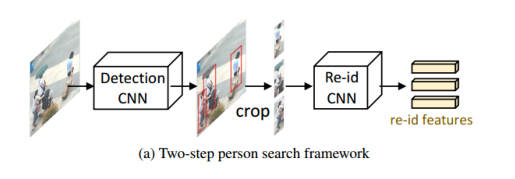

In [28]:
# Show two-step framework
img = Image.open("/kaggle/input/images/twostepfw.png")
plt.imshow(img)
plt.axis("off")
plt.show()

### **Detection**
A Faster R-CNN model is used to predict bounding boxes corresponding to persons in each gallery image. Only detections with confidence score greater than 0.3 are retained for feature extraction.
During evaluation, predicted boxes are considered correct if their IoU with ground-truth boxes exceeds 0.5.
  
### **Person Re-Id**
A feature extractor (e.g., ResNet50 or ConvNeXt-Tiny) maps each cropped person region into a fixed-dimensional embedding space (here 512). At inference time, query embeddings are compared against the gallery embeddings using cosine similarity, and candidates are ranked accordingly. The evaluation metrics are: mAP and Top-1 accuracy.

### **Optimization**
- Optimizer: AdamW
- Learning rate schedule: MultiStepLR
- Weight decay: fixed across experiments
- Training epochs: selected based on validation performance


### Model Variations

The ablation study focuses on two main factors:

1. Backbone architecture
     - ResNet50
     - ConvNeXt-Tiny
2. Training recipe
    - ArcFace angular margin loss
    - ArcFace followed by supervised contrastive fine-tuning (InfoNCE)

**Model selection** (including epoch choice and temperature for contrastive fine-tuning) is performed exclusively on the validation split. The test set is used only once for final performance reporting in order to assess generalization to unseen identities.

## Runtime settings

In [ ]:
import warnings
import wandb

!pip install -q wandb
!wandb login

os.environ["WANDB_API_KEY"] = "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"

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

In [2]:
device = "cpu"
if torch.cuda.is_available():
  print("All good, a GPU is available.")
  device = torch.device("cuda:0")
else:
  print("Please set GPU via Edit -> Notebook Settings.")

All good, a GPU is available.


## Reproducibility & deterministic mode

In [4]:
def fix_random(seed: int) -> None:
    """Fix all the possible sources of randomness.

    Args:
        seed: the seed to use.
    """
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed = 42
fix_random(seed=seed)

## Data loading and train/val/test split

In [ ]:
from dataclasses import dataclass

class PRW_dataset(Dataset):
    """
    Dataset for PRW person search.
    Loads images and their corresponding bounding boxes and person IDs.
    """
    @staticmethod
    def _load_mat_list(mat_path: Path, key: str):
        d = scipy.io.loadmat(mat_path)
        if key not in d:
            raise KeyError(f"Key '{key}' not found in {mat_path}. Keys: {list(d.keys())}")
        arr = d[key]
        return [x[0].item() for x in arr]  # e.g. 'c1s1_000151'

    @classmethod
    def find_train_test_data(cls, frames_path: Path, train_frames_path: Path, test_frames_path: Path):
        """
        Find and verify the list of frames for train/test splits based on .mat files and available images.
        """
        frames = [p.stem for p in sorted(frames_path.glob("*.jpg"))]  # 'c1s1_000151'
        frames_set = set(frames)

        train_names = cls._load_mat_list(train_frames_path, "img_index_train")
        test_names  = cls._load_mat_list(test_frames_path,  "img_index_test")

        train_set = set(train_names)
        test_set  = set(test_names)

        list_train_frames = [f for f in frames if f in train_set]
        list_test_frames  = [f for f in frames if f in test_set]

        if len(list_train_frames) != len(train_names):
            missing = [n for n in train_names if n not in frames_set]
            raise AssertionError(f"Train mismatch: matched={len(list_train_frames)} vs mat={len(train_names)}. Missing (first 10): {missing[:10]}")
        if len(list_test_frames) != len(test_names):
            missing = [n for n in test_names if n not in frames_set]
            raise AssertionError(f"Test mismatch: matched={len(list_test_frames)} vs mat={len(test_names)}. Missing (first 10): {missing[:10]}")

        return list_train_frames, list_test_frames

    def __init__(
        self,
        frames_path: Path,
        path_annotations: Path,
        train_frames_path: Path,
        test_frames_path: Path,
        split: str = "train",
        img_transform=None,
        filter_invalid_ids: bool = False,         # if True: keep only ids > 0
        allowed_pids: Optional[Set[int]] = None,  # keep only these IDs (positive ids)
        drop_empty: bool = False,                 # if True: drop images that have zero boxes after filtering
    ):
        self.img_transform = img_transform
        self.filter_invalid_ids = filter_invalid_ids
        self.allowed_pids = allowed_pids
        self.drop_empty = drop_empty

        split = split.lower()
        if split not in {"train", "test"}:
            raise ValueError("split must be 'train' or 'test'")

        train_frames, test_frames = self.find_train_test_data(frames_path, train_frames_path, test_frames_path)
        allowed_frames = set(train_frames if split == "train" else test_frames)

        self.images = [p for p in sorted(frames_path.glob("*.jpg")) if p.stem in allowed_frames]

        # annotations are named like: c1s1_002876.jpg.mat
        annots = {p.stem: p for p in path_annotations.rglob("*.mat")}  # key: 'c1s1_002876.jpg'

        # building tuples (img, bbox)
        pairs = []
        for img_path in self.images:
            ann_key = img_path.name  # e.g. 'c1s1_002876.jpg'
            ann_path = annots.get(ann_key)
            if ann_path is None:
                raise RuntimeError(f"Missing annotation for frame {img_path.name}")
            pairs.append((img_path, ann_path))

        # pre-loading .mat files for bboxes
        self.box_cache = {}
        for img_path, ann_path in pairs:
            mat = scipy.io.loadmat(ann_path)
            arr = mat.get("box_new", mat.get("anno_file", mat.get("box", None)))

            if arr is None:
                boxes = np.zeros((0, 4), np.float32)
                ids   = np.zeros((0,), np.int64)
            else:
                arr = np.asarray(arr).reshape(-1, 5)
                ids = arr[:, 0].astype(np.int64)
                x = arr[:, 1].astype(np.float32)
                y = arr[:, 2].astype(np.float32)
                w = arr[:, 3].astype(np.float32)
                h = arr[:, 4].astype(np.float32)
                boxes = np.stack([x, y, x + w, y + h], axis=1).astype(np.float32)

            self.box_cache[str(ann_path)] = (boxes, ids)

        # build self.pairs
        self.pairs = []
        for img_path, ann_path in pairs:
            boxes_np, ids_np = self.box_cache[str(ann_path)]

            # filter invalid ids (e.g. -2 distractors, 0 background)
            if self.filter_invalid_ids:
                keep = ids_np > 0
                boxes_np = boxes_np[keep]
                ids_np = ids_np[keep]

            # filter by allowed_pids (ID-disjoint train/val)
            if self.allowed_pids is not None:
                keep = np.isin(ids_np, np.array(list(self.allowed_pids), dtype=np.int64))
                boxes_np = boxes_np[keep]
                ids_np = ids_np[keep]

            # update cache (filtered view)
            self.box_cache[str(ann_path)] = (boxes_np, ids_np)

            if self.drop_empty and boxes_np.shape[0] == 0:
                continue

            self.pairs.append((img_path, ann_path))

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, Dict[str, Any]]:
        img_path, ann_path = self.pairs[idx]

        img = Image.open(img_path).convert("RGB")
        boxes_np, ids_np = self.box_cache[str(ann_path)]

        target = {
            "boxes": torch.as_tensor(boxes_np, dtype=torch.float32),
            "labels": torch.ones((boxes_np.shape[0],), dtype=torch.int64),
            "image_id": torch.tensor([idx], dtype=torch.int64),
            "person_id": torch.as_tensor(ids_np, dtype=torch.int64),
        }

        if self.img_transform is not None:
            img = self.img_transform(img)
        if not torch.is_tensor(img):
            img = FT.to_tensor(img)

        return img, target

    def __len__(self) -> int:
        return len(self.pairs)

    def unique_positive_pids(self) -> Set[int]:
        """Collect unique IDs > 0 present in this dataset view (after any filtering)."""
        s = set()
        for _, ann_path in self.pairs:
            _, ids_np = self.box_cache[str(ann_path)]
            for pid in ids_np.tolist():
                if pid > 0:
                    s.add(int(pid))
        return s

In [5]:
# Data paths
path_imgs = Path("/kaggle/input/datasets/edoardomerli/prw-person-re-identification-in-the-wild/frames")
path_annot = Path("/kaggle/input/datasets/edoardomerli/prw-person-re-identification-in-the-wild/annotations")
train_frames_mat = Path("/kaggle/input/datasets/edoardomerli/prw-person-re-identification-in-the-wild/frame_train.mat")
test_frames_mat = Path("/kaggle/input/datasets/edoardomerli/prw-person-re-identification-in-the-wild/frame_test.mat")

query_info_path = Path("/kaggle/input/datasets/edoardomerli/prw-person-re-identification-in-the-wild/query_info.txt")
query_imgs_path = Path("/kaggle/input/datasets/edoardomerli/prw-person-re-identification-in-the-wild/query_box")

## Detection
The detection pipeline, available in the *detection.ipynb* file, produces in output a data structure that contains the bounding boxes for each image in the test set. As said before, this would be our starting point for the Re-Id pipeline, instead.

In [6]:
# load predictions
with open("/kaggle/input/detector-weights/test_preds.pkl",  "rb") as fp:
    test_detections = pickle.load(fp)

In [7]:
# sanity check
num_detections_test = [test_detections[i].shape[0] for i in range(len(test_detections))]
print(f"Total test detections: {len(test_detections)}")  # should be len(test_ds)
print("Per-img")
print("- min num_det:", min(num_detections_test))
print("- mean num_det:", int(sum(num_detections_test) / len(num_detections_test)))
print("- max num_det:", max(num_detections_test))

Total test detections: 6112
Per-img
- min num_det: 1
- mean num_det: 5
- max num_det: 23


## Re-IDentification
In this section, we present the complete person re-identification (Re-ID) pipeline adopted in our work. The task consists in matching a query person against a large gallery of detected individuals, retrieving images that correspond to the same identity despite variations in camera viewpoint, pose, scale, and background clutter.

In [8]:
from typing import Optional, Callable, Dict, List, Tuple
from torch.cuda.amp import GradScaler
from torch.amp import autocast
from typing import Callable

import torchvision.transforms as T
import torchvision.transforms.functional as FT
import math
import time
import re
import torch.nn.functional as F
import torchvision.models as models

In [ ]:
def parse_cam_id_from_stem(stem: str) -> int:
    """
    PRW frame names look like: cNsM_XXXXX (stem)
    We parse 'cN' -> cam_id=N
    """
    m = re.match(r"c(\d+)", stem)
    if not m:
        raise ValueError(f"Cannot parse cam_id from stem: {stem}")
    return int(m.group(1))


def clip_box_xyxy(box: np.ndarray, w: int, h: int) -> np.ndarray:
    """Clip box to image boundaries and ensure x1<=x2, y1<=y2."""
    x1, y1, x2, y2 = box
    x1 = float(np.clip(x1, 0, w - 1))
    y1 = float(np.clip(y1, 0, h - 1))
    x2 = float(np.clip(x2, 0, w - 1))
    y2 = float(np.clip(y2, 0, h - 1))
    x1, x2 = min(x1, x2), max(x1, x2)
    y1, y2 = min(y1, y2), max(y1, y2)
    return np.array([x1, y1, x2, y2], dtype=np.float32)


def expand_and_jitter_box_xyxy(
    box: np.ndarray,
    img_w: int,
    img_h: int,
    expand_ratio: float = 0.2,
    jitter_ratio: float = 0.05,
    do_jitter: bool = True,
) -> np.ndarray:
    """Expand box by a certain ratio and optionally apply random jittering."""
    x1, y1, x2, y2 = box.astype(np.float32)
    bw, bh = (x2 - x1), (y2 - y1)
    cx, cy = x1 + 0.5 * bw, y1 + 0.5 * bh

    # expand
    bw2 = bw * (1.0 + expand_ratio)
    bh2 = bh * (1.0 + expand_ratio)

    if do_jitter:
        cx += (random.uniform(-1, 1) * jitter_ratio) * bw
        cy += (random.uniform(-1, 1) * jitter_ratio) * bh
        scale = 1.0 + random.uniform(-jitter_ratio, jitter_ratio)
        bw2 *= scale
        bh2 *= scale

    nx1 = cx - 0.5 * bw2
    ny1 = cy - 0.5 * bh2
    nx2 = cx + 0.5 * bw2
    ny2 = cy + 0.5 * bh2
    return clip_box_xyxy(np.array([nx1, ny1, nx2, ny2], dtype=np.float32), img_w, img_h)


def load_id_list(mat_path: Path, key: str) -> List[int]:
    """Load a list of IDs from a .mat file under the specified key."""
    d = scipy.io.loadmat(mat_path)
    if key not in d:
        raise KeyError(f"Key '{key}' not found in {mat_path}. Keys: {list(d.keys())}")
    arr = np.asarray(d[key]).reshape(-1)
    return [int(x) for x in arr]


class PRWReIDDatasetCE(Dataset):
    """
    Crops GT boxes from the PRW_dataset and returns:
      crop_tensor, label (0..C-1), pid, camid
    """

    def __init__(
        self,
        prw_det_ds,                                # the PRW_dataset(split="train" or "test")
        crop_transform: Optional[Callable] = None,
        id_train_mat: Optional[Path] = None,       # e.g. ID_train.mat (recommended for training)
        id_test_mat: Optional[Path] = None,        # e.g. ID_test.mat (recommended for test eval)
        split: str = "train",                      # "train" or "test" just for ID filtering
        filter_invalid_ids: bool = True,           # ignore pid <= 0
        min_box_size: int = 10,
        expand_ratio: float = 0.2,
        jitter_ratio: float = 0.05,
        jitter: bool = True,
    ):
        self.base = prw_det_ds
        self.crop_transform = crop_transform
        self.filter_invalid_ids = filter_invalid_ids
        self.min_box_size = min_box_size
        self.expand_ratio = expand_ratio
        self.jitter_ratio = jitter_ratio
        self.jitter = jitter

        split = split.lower()
        assert split in {"train", "test"}
        self.split = split

        # Restrict to train/test IDs based on provided .mat files
        allowed_ids = None
        if split == "train" and id_train_mat is not None:
            allowed_ids = set(load_id_list(id_train_mat, "ID_train"))
        if split == "test" and id_test_mat is not None:
            allowed_ids = set(load_id_list(id_test_mat, "ID_test2"))

        self.samples: List[Dict] = []
        for _, (img_path, ann_path) in enumerate(self.base.pairs):
            boxes_np, ids_np = self.base.box_cache[str(ann_path)]
            if boxes_np is None or len(boxes_np) == 0:
                continue

            if self.filter_invalid_ids:
                keep = ids_np > 0
                boxes_np = boxes_np[keep]
                ids_np = ids_np[keep]

            if allowed_ids is not None:
                keep = np.array([pid in allowed_ids for pid in ids_np], dtype=bool)
                boxes_np = boxes_np[keep]
                ids_np = ids_np[keep]

            stem = Path(img_path).stem
            camid = parse_cam_id_from_stem(stem)

            for b, pid in zip(boxes_np, ids_np):
                x1, y1, x2, y2 = b.tolist()
                if (x2 - x1) < self.min_box_size or (y2 - y1) < self.min_box_size:
                    continue
                self.samples.append(
                    {
                        "img_path": str(img_path),
                        "bbox": b.astype(np.float32),
                        "pid": int(pid),
                        "camid": int(camid),
                    }
                )

        # CE needs contiguous labels
        self.pids = sorted({s["pid"] for s in self.samples})
        self.pid2label = {pid: i for i, pid in enumerate(self.pids)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, i: int):
        s = self.samples[i]
        img = Image.open(s["img_path"]).convert("RGB")
        W, H = img.size

        box = expand_and_jitter_box_xyxy(
            s["bbox"], W, H,
            expand_ratio=self.expand_ratio,
            jitter_ratio=self.jitter_ratio,
            do_jitter=self.jitter,
        )

        x1, y1, x2, y2 = box
        crop = img.crop((x1, y1, x2, y2))

        if self.crop_transform is not None:
            crop = self.crop_transform(crop)
        else:
            crop = FT.to_tensor(crop)

        pid = s["pid"]
        label = self.pid2label[pid]
        camid = s["camid"]

        return crop, torch.tensor(label, dtype=torch.long), torch.tensor(pid), torch.tensor(camid)

In [10]:
# Performing augmentation just on training bboxes
train_reid_tf = T.Compose([
    T.Resize((256, 128)),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

test_reid_tf = T.Compose([
    T.Resize((256, 128)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

### Evaluation

In [11]:
from scipy.io import loadmat
from sklearn.metrics import average_precision_score
from dataclasses import dataclass
import os.path as osp

#### Original evaluation function

In [12]:
# This is a minimally modified version of the eval function from the SeqNet repository (https://github.com/serend1p1ty/SeqNet/blob/master/eval_func.py)
# Changes:
# - Removed code related to CBGM (Context Bipartite Graph Matching)
# - Adjusted top-k accuracy calculation to only consider top-1 accuracy
# - Clarified function docstring and added recall rate scaling explanation

def _compute_iou(a, b):
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])
    inter = max(0, x2 - x1) * max(0, y2 - y1)
    union = (a[2] - a[0]) * (a[3] - a[1]) + (b[2] - b[0]) * (b[3] - b[1]) - inter
    return inter * 1.0 / union

def eval_search_prw(
    gallery_dataset,
    query_dataset,
    gallery_dets,
    gallery_feats,
    query_box_feats,
    det_thresh,
    ignore_cam_id=True,
):
    """
    Evaluate person search performance on PRW dataset.

    Args:
        gallery_dataset (Dataset): dataset containing gallery images.
        query_dataset (Dataset): dataset containing query images.
        gallery_dets (list of ndarray): n_det x [x1, x2, y1, y2, score] per image. 
        gallery_feats (list of ndarray): n_det x D features per image.
        query_box_feats (list of ndarray): D dimensional features per query image.
        det_thresh (float): filter out gallery detections whose scores below this.
        ignore_cam_id (bool): whether to ignore camera ID during evaluation. If set to False,
                            gallery images from the same camera as the query will be excluded. Default: True.
    """
    assert len(gallery_dataset) == len(gallery_dets)
    assert len(gallery_dataset) == len(gallery_feats)
    assert len(query_dataset) == len(query_box_feats)

    annos = gallery_dataset.annotations
    name_to_det_feat = {}
    for anno, det, feat in zip(annos, gallery_dets, gallery_feats):
        name = anno["img_name"]
        scores = det[:, 4].ravel()
        inds = np.where(scores >= det_thresh)[0]
        if len(inds) > 0:
            name_to_det_feat[name] = (det[inds], feat[inds])

    aps = []
    accs = []
    topk = [1] # we are only interested in top-1 accuracy
    ret = {"image_root": gallery_dataset.img_prefix, "results": []}
    for i in range(len(query_dataset)):
        y_true, y_score = [], []
        imgs, rois = [], []
        count_gt, count_tp = 0, 0

        feat_p = query_box_feats[i].ravel()

        query_imname = query_dataset.annotations[i]["img_name"]
        query_roi = query_dataset.annotations[i]["boxes"]
        query_pid = query_dataset.annotations[i]["pids"]
        query_cam = query_dataset.annotations[i]["cam_id"]

        # Find all occurence of this query
        gallery_imgs = []
        for x in annos:
            if query_pid in x["pids"] and x["img_name"] != query_imname:
                gallery_imgs.append(x)
        query_gts = {}
        for item in gallery_imgs:
            query_gts[item["img_name"]] = item["boxes"][item["pids"] == query_pid]

        # Construct gallery set for this query
        if ignore_cam_id:
            gallery_imgs = []
            for x in annos:
                if x["img_name"] != query_imname:
                    gallery_imgs.append(x)
        else:
            gallery_imgs = []
            for x in annos:
                if x["img_name"] != query_imname and x["cam_id"] != query_cam:
                    gallery_imgs.append(x)

        name2sim = {}
        sims = []
        # 1. Go through all gallery samples
        for item in gallery_imgs:
            gallery_imname = item["img_name"]
            # some contain the query (gt not empty), some not
            count_gt += gallery_imname in query_gts
            # compute distance between query and gallery dets
            if gallery_imname not in name_to_det_feat:
                continue
            det, feat_g = name_to_det_feat[gallery_imname]
            # get L2-normalized feature matrix NxD
            feat_g = np.asarray(feat_g).reshape(len(det), -1)   # (Nd, D)
            feat_p = np.asarray(feat_p).reshape(-1)            # (D,)
            # compute cosine similarities
            sim = feat_g.dot(feat_p).ravel()

            if gallery_imname in name2sim:
                continue
            name2sim[gallery_imname] = sim
            sims.extend(list(sim))

        for gallery_imname, sim in name2sim.items():
            det, feat_g = name_to_det_feat[gallery_imname]
            # assign label for each det
            label = np.zeros(len(sim), dtype=np.int32)
            if gallery_imname in query_gts:
                gt = query_gts[gallery_imname].ravel()
                w, h = gt[2] - gt[0], gt[3] - gt[1]
                iou_thresh = min(0.5, (w * h * 1.0) / ((w + 10) * (h + 10)))
                inds = np.argsort(sim)[::-1]
                sim = sim[inds]
                det = det[inds]
                # only set the first matched det as true positive
                for j, roi in enumerate(det[:, :4]):
                    if _compute_iou(roi, gt) >= iou_thresh:
                        label[j] = 1
                        count_tp += 1
                        break
            y_true.extend(list(label))
            y_score.extend(list(sim))
            imgs.extend([gallery_imname] * len(sim))
            rois.extend(list(det))

        # 2. Compute AP for this query (need to scale by recall rate)
        y_score = np.asarray(y_score)
        y_true = np.asarray(y_true)
        assert count_tp <= count_gt
        # Important: at the pedestrian detection stage, the model might have missed the person (failed to detect a box with IoU > 0.5).
        # To penalize the model for these False Negatives at the detection stage, scale the AP by recall (the ratio of found matches to total ground truth matches). 
        # E.g. if the detector missed the person entirely 50% of the time, the final AP score is cut in half.
        recall_rate = 0.0 if count_gt == 0 else (count_tp * 1.0 / count_gt)
        ap = 0 if count_tp == 0 else average_precision_score(y_true, y_score) * recall_rate
        #ap = 0 if count_tp == 0 else average_precision_score(y_true, y_score) # easier case

        
        aps.append(ap)
        inds = np.argsort(y_score)[::-1]
        y_score = y_score[inds]
        y_true = y_true[inds]
        accs.append([min(1, sum(y_true[:k])) for k in topk])
        # 4. Save result for JSON dump
        new_entry = {
            "query_img": str(query_imname),
            "query_roi": list(map(float, list(query_roi.squeeze()))),
            "query_gt": query_gts,
            "gallery": [],
        }
        # only save top-10 predictions
        for k in range(10):
            new_entry["gallery"].append(
                {
                    "img": str(imgs[inds[k]]),
                    "roi": list(map(float, list(rois[inds[k]]))),
                    "score": float(y_score[k]),
                    "correct": int(y_true[k]),
                }
            )
        ret["results"].append(new_entry)

    print("search ranking:")
    mAP = np.mean(aps)
    print("  mAP = {:.2%}".format(mAP))
    accs = np.mean(accs, axis=0)
    for i, k in enumerate(topk):
        print("  top-{:2d} = {:.2%}".format(k, accs[i]))

    # write_json(ret, "vis/results.json")

    ret["mAP"] = np.mean(aps)
    ret["accs"] = accs
    return ret

#### Eval utilities

In [ ]:
def load_prw_query_info_pid(query_info_path):
    """Load query info from query_info.txt and return a list of dicts with keys: pid, stem, img_name, box_xyxy, cam_id."""
    queries = []
    with open(query_info_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            pid_s, x_s, y_s, w_s, h_s, stem = line.split()
            pid = int(pid_s)
            x, y, w, h = map(float, (x_s, y_s, w_s, h_s))
            x1, y1, x2, y2 = x, y, x + w, y + h
            queries.append({
                "pid": pid,
                "stem": stem,  # e.g. c1s3_016471
                "img_name": stem + ".jpg",
                "box_xyxy": np.array([x1, y1, x2, y2], dtype=np.float32),
                "cam_id": parse_cam_id_from_stem(stem),
            })
    return queries

@dataclass
class QueryDataset:
    """Dataset for query info from query_info.txt. Each item is a dict with keys: img_name, boxes, pids, cam_id."""
    annotations: list
    img_prefix: str = ""
    def __len__(self): return len(self.annotations)

def build_query_dataset_from_query_info(query_info_path):
    queries = load_prw_query_info_pid(query_info_path)
    ann = []
    for q in queries:
        ann.append({
            "img_name": q["img_name"],
            "boxes": q["box_xyxy"][None, :],
            "pids": np.array([q["pid"]], dtype=np.int32),
            "cam_id": int(q["cam_id"]),
        })
    return QueryDataset(annotations=ann, img_prefix="")

In [ ]:
def forward_embed(model, batch):
    """Forward pass through the ReID model to get embedding features. Handles both cases where the model returns (logits, emb) or just emb."""
    out = model(batch)
    if isinstance(out, (tuple, list)) and len(out) == 2:
        logits, emb = out
        return emb              # emb_size = 512
    return out                  # fallback

@torch.no_grad()
def compute_query_box_feats_from_querybox(
    reid_model,
    query_info_path,
    query_box_dir,
    transform,
    device,
):
    """
    Compute ReID features for query boxes based on the provided query_info.txt and query_box_dir.
    """
    
    reid_model.eval()
    queries = load_prw_query_info_pid(query_info_path)

    feats = []
    for q in queries:
        pid = q["pid"]
        stem = q["stem"]
        path = osp.join(query_box_dir, f"{pid}_{stem}.jpg")
        img = Image.open(path).convert("RGB")
        x = transform(img).unsqueeze(0).to(device)

        emb = forward_embed(reid_model, x)             # emb_size = 512
        emb = F.normalize(emb, p=2, dim=1)             # sanity check
        feats.append(emb.squeeze(0).detach().cpu().numpy().astype(np.float32))

    return feats

In [ ]:
@torch.no_grad()
def build_gallery_feats(
    reid_model,
    prw_dataset,
    detections,
    transform,
    device,
):
    """
    Build gallery features by cropping detected boxes from gallery images and passing them through the ReID model.
    """
    
    reid_model.eval()
    gallery_feats = []
    assert len(prw_dataset) == len(detections)

    for idx in range(len(prw_dataset)):
        img_path, _ = prw_dataset.pairs[idx]
        img = Image.open(img_path).convert("RGB")

        det = detections[idx]
        if det.shape[0] == 0:
            gallery_feats.append(np.zeros((0, 1), dtype=np.float32))
            continue

        feats_img = []
        for box in det:
            x1, y1, x2, y2 = box[:4]
            x1, y1, x2, y2 = map(int, map(round, (x1, y1, x2, y2)))
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = max(x1 + 1, x2), max(y1 + 1, y2)

            crop = img.crop((x1, y1, x2, y2))
            x = transform(crop).unsqueeze(0).to(device)

            emb = forward_embed(reid_model, x)         # emb_size = 512
            emb = F.normalize(emb, p=2, dim=1)         # sanity check
            feats_img.append(emb.squeeze(0).detach().cpu().numpy())

        gallery_feats.append(np.vstack(feats_img).astype(np.float32))

    # fix empty dim
    D = None
    for f in gallery_feats:
        if f.shape[0] > 0:
            D = f.shape[1]
            break
    if D is None:
        raise ValueError("All gallery feats are empty (no detections?).")
    for i, f in enumerate(gallery_feats):
        if f.shape[0] == 0 and f.shape[1] != D:
            gallery_feats[i] = np.zeros((0, D), dtype=np.float32)

    return gallery_feats

In [ ]:
@torch.no_grad()
def evaluate_checkpoint_prw(
    ckpt_path,
    model,
    query_ds,
    gallery_eval,
    test_ds,
    test_detections,
    test_reid_tf,
    device,
):
    """
    Evaluate a ReID model checkpoint on the PRW person search task.
     - Loads the checkpoint and sets up the model.
     - Computes features for query boxes and gallery detections.
     - Runs the eval_search_prw function to compute mAP and top-1 accuracy.
     - Returns the raw evaluation results dictionary from eval_search_prw.
    """
    def _fmt_pct(x):
        x = float(x)
        return f"{x:.2f}%" if x > 1.0 else f"{100*x:.2f}%"

    def _extract_map_top1(ret):
        # --- mAP ---
        map_val = ret.get("mAP", ret.get("map", ret.get("MAP", None)))

        # --- top-1 (rank-1) ---
        top1_val = None
        accs = ret.get("accs", None)

        if isinstance(accs, (list, tuple)):
            if len(accs) > 0:
                top1_val = accs[0]
        elif hasattr(accs, "shape"):  # numpy array / torch tensor
            try:
                # numpy
                if getattr(accs, "size", 0) > 0:
                    top1_val = accs[0]
            except Exception:
                # torch tensor fallback
                if accs.numel() > 0:
                    top1_val = accs.flatten()[0].item()
        elif isinstance(accs, dict):
            for k in ["top1", "top-1", "rank1", "r1", "acc1"]:
                if k in accs:
                    top1_val = accs[k]
                    break

        return map_val, top1_val

    print(f"\n[Eval] Loading checkpoint: {ckpt_path}")
    ckpt = torch.load(ckpt_path, map_location=device)

    state_dict = ckpt["model"] if isinstance(ckpt, dict) and "model" in ckpt else ckpt

    model.load_state_dict(state_dict, strict=True)
    model.to(device)
    model.eval()

    # just compute features
    query_feats = compute_query_box_feats_from_querybox(
        reid_model=model,
        query_info_path=query_info_path,
        query_box_dir=query_imgs_path,
        transform=test_reid_tf,
        device=device,
    )

    gallery_feats = build_gallery_feats(
        reid_model=model,
        prw_dataset=test_ds,
        detections=test_detections,
        transform=test_reid_tf,
        device=device,
    )

    # evaluation process
    ret = eval_search_prw(
        gallery_dataset=gallery_eval,
        query_dataset=query_ds,
        gallery_dets=test_detections,
        gallery_feats=gallery_feats,
        query_box_feats=query_feats,
        det_thresh=0.3,
        ignore_cam_id=True,
    )

    # compute metrics
    map_val, top1_val = _extract_map_top1(ret)

    if map_val is not None and top1_val is not None:
        print(f"[Eval] {ckpt_path} → mAP={_fmt_pct(map_val)} | top-1={_fmt_pct(top1_val)}")
    else:
        print(f"[Eval] {ckpt_path} → cannot find mAP/top-1 in ret. keys={list(ret.keys())}")

    return ret

In [ ]:
@dataclass
class PRWGalleryForEval:
    """Dataset for gallery evaluation. Each item is a dict with keys: img_name, boxes, pids, cam_id."""
    annotations: list
    img_prefix: str

    def __len__(self):
        return len(self.annotations)

def build_gallery_eval_view(prw_dataset):
    """
    Create a compatible prediction with the eval_search_prw.
    """
    annos = []
    img_prefix = str(prw_dataset.pairs[0][0].parent)

    for idx, (img_path, ann_path) in enumerate(prw_dataset.pairs):
        stem = img_path.stem              # c1s3_016471
        img_name = img_path.name          # c1s3_016471.jpg

        boxes_np, ids_np = prw_dataset.box_cache[str(ann_path)]  # GT xyxy + ids

        # Typically, in PRW person search, -2 are distractors. For GT "occurrence" of query person..
        # .. I want ids>0 only
        keep = ids_np > 0
        boxes = boxes_np[keep]
        pids = ids_np[keep]

        cam_id = parse_cam_id_from_stem(stem)

        annos.append({
            "img_name": img_name,  # must match exactly what eval expects
            "boxes": boxes.astype(np.float32),
            "pids": pids.astype(np.int32),
            "cam_id": cam_id,
        })

    return PRWGalleryForEval(annotations=annos, img_prefix=img_prefix)

### Final Training
We select a subset of the best-performing models identified during the validation phase:

- **Baseline model:** ArcFace + ResNet50

- **Backbone ablation**: ArcFace + ConvNeXt-Tiny

- **Training recipe ablation using contrastive fine-tuning:** ArcFace -> InfoNCE (ResNet50 & ConvNeXt-Tiny)

These models are retained based on their validation performance and the insights gained from the ablation study. The final evaluation is conducted on the test set to verify whether the trends observed during validation consistently generalize to unseen identities.

In [ ]:
def build_trainval_reid_ds(
    frames_path: Path,
    path_annotations: Path,
    train_frames_mat: Path,
    test_frames_mat: Path,
    train_reid_tf,
    filter_invalid_ids: bool = True,
    id_train_mat: Optional[Path] = None,
):
    """
    Build the training dataset for ReID by:
    1. Creating a PRW_dataset for the trainval split (train_frames_mat) with appropriate filtering of invalid IDs.
    2. Creating a PRW_dataset for the test split (test_frames_mat) with appropriate filtering of invalid IDs.
    3. Creating a PRWReIDDatasetCE that takes the trainval PRW_dataset and applies cropping and transformations to produce the final ReID training dataset
    """
    
    # train+val frames
    trainval_det_ds = PRW_dataset(
        frames_path=frames_path,
        path_annotations=path_annotations,
        train_frames_path=train_frames_mat,
        test_frames_path=test_frames_mat,
        split="train",
        img_transform=None,
        filter_invalid_ids= not filter_invalid_ids,
        allowed_pids=None,     # include all train IDs
        drop_empty=False,
    )

    test_ds = PRW_dataset(
        frames_path=frames_path,
        path_annotations=path_annotations,
        train_frames_path=train_frames_mat,
        test_frames_path=test_frames_mat,
        split="test",
        img_transform=None,
        filter_invalid_ids=filter_invalid_ids,
        allowed_pids=None,
        drop_empty=False,
    )

    # GT crops dataset with contiguous pid2label across the trainval split
    trainval_reid_ds = PRWReIDDatasetCE(
        trainval_det_ds,
        crop_transform=train_reid_tf,
        split="train",
        filter_invalid_ids=filter_invalid_ids,
        id_train_mat=id_train_mat,
        id_test_mat=None,
        jitter=True,        
    )

    print(f"[TRAINVAL] base images={len(trainval_det_ds)} | crops={len(trainval_reid_ds)} | pids={len(trainval_reid_ds.pids)}")
    print(f"[TEST] base images={len(test_ds)}")
    return trainval_det_ds, test_ds, trainval_reid_ds

In [20]:
trainval_det_ds, test_ds, trainval_reid_ds = build_trainval_reid_ds(
                        frames_path=path_imgs,
                        path_annotations=path_annot,
                        train_frames_mat=train_frames_mat,
                        test_frames_mat=test_frames_mat,
                        train_reid_tf=train_reid_tf,
                        filter_invalid_ids=True,
                        id_train_mat=None
                        )

[TRAINVAL] base images=5704 | crops=14907 | pids=483
[TEST] base images=6112


In [21]:
# 1) Build gallery view for eval (GT annotations etc.)
gallery_eval = build_gallery_eval_view(test_ds)

# 2) Build query dataset from query_info
query_ds = build_query_dataset_from_query_info(query_info_path)

In [22]:
# Some params
emb_dim = 512
use_amp = True
num_classes = len(trainval_reid_ds.pids)
print(f"Num. train ids: {num_classes}")

Num. train ids: 483


### Train utils

In [ ]:
def train_reid_experiment(
    *,
    model: torch.nn.Module,
    train_loader,
    criterion,
    device: str,
    run_name: str,
    wandb_project: str,
    wandb_entity: str,
    config: dict,
    n_epochs: int = 20,
    lr: float = 3e-4,
    weight_decay: float = 1e-4,
    warmup_epochs: int = 1,
    milestones=(16,),
    gamma: float = 0.1,
    use_amp: bool = True,
    save_every: int = 5,
    always_save_epochs=(4, 5, 6),   # epoch numbers to always save
    save_epoch0: bool = False,      # save before training starts
    ckpt_dir: str = ".",
    extra_state: dict = None,       # e.g. to icnldue pid2label, emb_dim, num_classes...
    eval_metric_key: str = "val/acc1",  
):
    """Train a ReID model with the given configuration and log results to Weights & Biases"""

    if extra_state is None:
        extra_state = {}

    os.makedirs(ckpt_dir, exist_ok=True)

    model = model.to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

    # AMP scaler
    scaler = torch.amp.GradScaler("cuda", enabled=use_amp)

    # schedulers
    steps_per_epoch = len(train_loader)
    warmup_steps = max(1, warmup_epochs * steps_per_epoch)

    def warmup_lambda(step: int) -> float:
        # linearly ramp lr from 0 -> base lr over warmup_steps optimizer updates
        if step < warmup_steps:
            return (step + 1) / warmup_steps
        return 1.0

    warmup_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=warmup_lambda)
    step_scheduler = torch.optim.lr_scheduler.MultiStepLR(
        optimizer, milestones=list(milestones), gamma=gamma
    )

    # wandb init
    run = wandb.init(
        entity=wandb_entity,
        project=wandb_project,
        config={
            **config,
            "epochs": n_epochs,
            "learning_rate": lr,
            "weight_decay": weight_decay,
            "scheduler": f"warmup({warmup_epochs} epoch, per-update) + MultiStepLR(milestones={list(milestones)}, gamma={gamma})",
            "warmup_epochs": warmup_epochs,
            "warmup_steps": warmup_steps,
            "milestones": list(milestones),
            "gamma": gamma,
            "amp": use_amp,
            "save_every_epochs": save_every,
            "always_save_epochs": list(always_save_epochs),
            "eval_metric_key": eval_metric_key,
        },
        name=run_name,
        reinit=True,
    )

    def save_ckpt(path: str, epoch: int, global_step: int):
        ckpt = {
            "epoch": epoch,  # 0 means untrained snapshot if save_epoch0=True
            "global_step": global_step,
            "model": model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "warmup_scheduler": warmup_scheduler.state_dict(),
            "step_scheduler": step_scheduler.state_dict(),
            "scaler": scaler.state_dict() if use_amp else None,
            **extra_state,
        }
        torch.save(ckpt, path)
        artifact = wandb.Artifact(os.path.basename(path).replace(".pth", ""), type="model")
        artifact.add_file(path)
        wandb.log_artifact(artifact)

    def should_save(epoch_1based: int) -> bool:
        if epoch_1based in set(always_save_epochs):
            return True
        if save_every > 0 and (epoch_1based % save_every == 0):
            return True
        return False

    # -- save epoch 0 (safety check) --
    global_step = 0
    warmup_updates_done = 0  

    if save_epoch0:
        path0 = os.path.join(ckpt_dir, f"{run_name}_epoch00.pth")
        save_ckpt(path0, epoch=0, global_step=global_step)

    best_score = -math.inf
    best_path = None

    # -- training loop --
    for epoch in range(1, n_epochs + 1):
        model.train()
        running_loss, running_acc1 = 0.0, 0.0

        for crops, labels, pid, camid in train_loader:
            crops = crops.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True).view(-1)

            optimizer.zero_grad(set_to_none=True)

            with autocast(device_type="cuda", enabled=use_amp):
                logits, emb = model(crops, labels=labels)
                loss = criterion(logits, labels)

            # AMP-safe step + detect overflow-skip
            prev_scale = scaler.get_scale()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            skipped = scaler.get_scale() < prev_scale  # overflow -> step skipped

            # warmup step only if optimizer really stepped
            if (not skipped) and (warmup_updates_done < warmup_steps):
                warmup_scheduler.step()
                warmup_updates_done += 1

            with torch.no_grad():
                loss_val = float(loss.item())
                pred = logits.argmax(dim=1)
                acc1 = (pred == labels).float().mean().item()
                emb_norm = emb.norm(dim=1).mean().item()
                max_prob = F.softmax(logits, dim=1).max(dim=1).values.mean().item()
                lr_now = optimizer.param_groups[0]["lr"]

            running_loss += loss_val
            running_acc1 += acc1

            wandb.log(
                {
                    "train/loss": loss_val,
                    "train/acc1": acc1,
                    "train/emb_norm_mean": emb_norm,
                    "train/max_prob_mean": max_prob,
                    "train/lr": lr_now,
                    "epoch": epoch,
                    "step": global_step,
                    "train/amp_skipped_step": int(skipped),
                    "train/warmup_updates_done": warmup_updates_done,
                },
                step=global_step
            )
            global_step += 1

        # epoch averages
        epoch_loss = running_loss / max(1, len(train_loader))
        epoch_acc1 = running_acc1 / max(1, len(train_loader))
        wandb.log(
            {"train/epoch_loss_avg": epoch_loss, "train/epoch_acc1_avg": epoch_acc1, "epoch": epoch},
            step=global_step
        )
        print(f"[Epoch {epoch:02d}] loss={epoch_loss:.4f} acc1={epoch_acc1:.4f}")

        # step multi-step scheduler
        step_scheduler.step()

        # -- checkpoint saving --
        if should_save(epoch):
            ckpt_path = os.path.join(ckpt_dir, f"{run_name}_epoch{epoch:02d}.pth")
            save_ckpt(ckpt_path, epoch=epoch, global_step=global_step)
            print(f"[CKPT] Saved {ckpt_path}")

    run.finish()
    return {"best_score": best_score, "best_ckpt": best_path}


In [23]:
def build_criterion_ce(params):
    return nn.CrossEntropyLoss(label_smoothing=params.get("label_smoothing", 0.0))

base_config = {
    "seed": seed,
    "dataset": "PRW",
    "backbone": "resnet50",
    "loss": "CE",
    "resize": "(256,128)",
    "lr": 3e-4,
    "weight_decay": 1e-4,
    "warmup_epochs": 1,
    "milestones": [16],
    "gamma": 0.1,
}

base_config_cx = {
    "seed": seed,
    "dataset": "PRW",
    "backbone": "ConvNeXt_Tiny",
    "loss": "CE",
    "resize": "(256,128)",
    "lr": 3e-4,
    "weight_decay": 1e-4,
    "warmup_epochs": 1,
    "milestones": [16],
    "gamma": 0.1,
}

### Baseline model: ArcFace + ResNet50
Our baseline model consists of a ResNet50 backbone trained with the ArcFace loss. The backbone extracts feature representations from cropped person images, while the angular margin loss enforces inter-class separation and intra-class compactness in the embedding space.

In [24]:
class ReIDNetArcFace(nn.Module):
    def __init__(self, emb_dim, num_classes, s=30.0, m=0.35):
        super().__init__()
        backbone = models.resnet50(
            weights=models.ResNet50_Weights.IMAGENET1K_V2
        )
        self.backbone = nn.Sequential(*list(backbone.children())[:-2])
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(2048, emb_dim)

        self.cls = ArcFaceClassifier(
            in_dim=emb_dim,
            num_classes=num_classes,
            s=s,
            m=m
        )

    def forward(self, x, labels=None):
        f = self.backbone(x)
        f = self.pool(f).flatten(1)
        z = self.fc(f)
        z = F.normalize(z, dim=1)  # alwys normalize

        logits = self.cls(z, labels=labels)
        return logits, z


class ArcFaceClassifier(nn.Module):
    def __init__(self, in_dim, num_classes, s=30.0, m=0.35):
        super().__init__()
        self.weight = nn.Parameter(torch.randn(num_classes, in_dim))
        nn.init.normal_(self.weight, std=0.01)

        self.s = s
        self.m = m

        # cos(m) and sin(m) are constants
        self.cos_m = math.cos(m)
        self.sin_m = math.sin(m)
        self.th = math.cos(math.pi - m)
        self.mm = math.sin(math.pi - m) * m

    def forward(self, x_normed, labels=None):
        w = F.normalize(self.weight, dim=1)        # (C, D)
        cosine = torch.matmul(x_normed, w.t())     # (B, C)

        if labels is None:
            # inference
            return self.s * cosine

        # -- ArcFace margin --
        sine = torch.sqrt(1.0 - torch.clamp(cosine ** 2, 0, 1))
        phi = cosine * self.cos_m - sine * self.sin_m  # cos(theta + m)

        # safeguard
        phi = torch.where(cosine > self.th, phi, cosine - self.mm)

        one_hot = torch.zeros_like(cosine)
        one_hot.scatter_(1, labels.view(-1, 1), 1.0)

        logits = one_hot * phi + (1.0 - one_hot) * cosine
        return self.s * logits

In [ ]:
def build_arcface_trainval_loader(
    trainval_reid_ds,
    batch_size: int = 64,
    num_workers: int = 4,
):
    """Build DataLoader for training ArcFace ReID model. Uses standard shuffling and batching."""
    return DataLoader(
        trainval_reid_ds,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
        persistent_workers=(num_workers > 0),
        prefetch_factor=2 if num_workers > 0 else None,
        drop_last=True,
    )

In [26]:
# Loader of trainval ds
trainval_loader = build_arcface_trainval_loader(trainval_reid_ds)

##### Training model
Up to 20 epochs as we find out in the validation phase.

In [51]:
# train
"""out_af = train_reid_experiment(
        model=ReIDNetArcFace(emb_dim=emb_dim, num_classes=num_classes, s=30.0, m=0.25).to(device),
        train_loader=trainval_loader,
        val_loader=None, 
        criterion=build_criterion_ce({"label_smoothing": 0.0}),
        device=device,
        run_name="arcface_r50_m25_final",
        wandb_project="person re-id valsplit",
        wandb_entity="unibo-ai",
        config=base_config,
        n_epochs=20,
        lr=3e-4,
        weight_decay=1e-4,
        warmup_epochs=1,
        milestones=[16],
        gamma=0.1,
        use_amp=use_amp,
        save_every=5,
        always_save_epochs=(4,5,6),
        ckpt_dir="./ckpts",
        extra_state={"num_classes": num_classes, "emb_dim": emb_dim, "pid2label": trainval_reid_ds.pid2label},
    )
print(out_af)"""

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: Currently logged in as: tommaso-perniola (unibo-ai) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


[Epoch 01] loss=11.0342 acc1=0.0667
[Epoch 02] loss=3.4463 acc1=0.4834
[Epoch 03] loss=1.2211 acc1=0.7645
[Epoch 04] loss=0.6232 acc1=0.8679
[CKPT] Saved ./ckpts/arcface_r50_m25_final_epoch04.pth
[Epoch 05] loss=0.3317 acc1=0.9269
[CKPT] Saved ./ckpts/arcface_r50_m25_final_epoch05.pth
[Epoch 06] loss=0.2282 acc1=0.9455
[CKPT] Saved ./ckpts/arcface_r50_m25_final_epoch06.pth
[Epoch 07] loss=0.2111 acc1=0.9520
[Epoch 08] loss=0.1861 acc1=0.9569
[Epoch 09] loss=0.1746 acc1=0.9559
[Epoch 10] loss=0.2027 acc1=0.9531
[CKPT] Saved ./ckpts/arcface_r50_m25_final_epoch10.pth
[Epoch 11] loss=0.1464 acc1=0.9619
[Epoch 12] loss=0.1252 acc1=0.9698
[Epoch 13] loss=0.1142 acc1=0.9736
[Epoch 14] loss=0.1650 acc1=0.9616
[Epoch 15] loss=0.1638 acc1=0.9618
[CKPT] Saved ./ckpts/arcface_r50_m25_final_epoch15.pth
[Epoch 16] loss=0.1442 acc1=0.9665
[Epoch 17] loss=0.0480 acc1=0.9890
[Epoch 18] loss=0.0188 acc1=0.9964
[Epoch 19] loss=0.0152 acc1=0.9978
[Epoch 20] loss=0.0085 acc1=0.9985
[CKPT] Saved ./ckpts/arc

epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇██
step,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train/acc1,▁▅▅▇▇▇▇▇█████▇███████████████▇▇▇███▇████
train/amp_skipped_step,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/emb_norm_mean,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/epoch_acc1_avg,▁▄▆▇▇███████████████
train/epoch_loss_avg,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/lr,▁████████████████████████████████▁▁▁▁▁▁▁
train/max_prob_mean,▁▃▃▆▇▇▇▇████▇▇██████████████████▇███████
+1,...


{'best_score': -inf, 'best_ckpt': None}


##### Evaluating model

In [61]:
# Evaluate per each ckpt epoch (even though validation is clear about which is the best epoch)
"""ckpt_epochs = [20, 5, 10, 15]
ckpt_paths  = [f"/kaggle/working/ckpts/arcface_r50_m25_final_epoch{e:02d}.pth" for e in ckpt_epochs]

model_reid_af = ReIDNetArcFace(emb_dim=emb_dim, num_classes=num_classes, s=30.0, m=0.25).to(device)

results = {}
for epoch, ckpt_path in zip(ckpt_epochs, ckpt_paths):
    ret = evaluate_checkpoint_prw(
        ckpt_path=ckpt_path,
        model=model_reid_af,
        query_ds=query_ds,
        gallery_eval=gallery_eval,
        test_ds=test_ds,
        test_detections=test_detections,
        test_reid_tf=test_reid_tf,
        device=device,
    )
    results[epoch] = ret"""


[Eval] Loading checkpoint: /kaggle/working/ckpts/arcface_r50_m25_final_epoch20.pth
search ranking:
  mAP = 44.22%
  top- 1 = 83.13%
[Eval] /kaggle/working/ckpts/arcface_r50_m25_final_epoch20.pth → mAP=44.22% | top-1=83.13%

[Eval] Loading checkpoint: /kaggle/working/ckpts/arcface_r50_m25_final_epoch05.pth
search ranking:
  mAP = 44.02%
  top- 1 = 83.37%
[Eval] /kaggle/working/ckpts/arcface_r50_m25_final_epoch05.pth → mAP=44.02% | top-1=83.37%

[Eval] Loading checkpoint: /kaggle/working/ckpts/arcface_r50_m25_final_epoch10.pth
search ranking:
  mAP = 43.44%
  top- 1 = 82.26%
[Eval] /kaggle/working/ckpts/arcface_r50_m25_final_epoch10.pth → mAP=43.44% | top-1=82.26%

[Eval] Loading checkpoint: /kaggle/working/ckpts/arcface_r50_m25_final_epoch15.pth
search ranking:
  mAP = 40.37%
  top- 1 = 80.55%
[Eval] /kaggle/working/ckpts/arcface_r50_m25_final_epoch15.pth → mAP=40.37% | top-1=80.55%


> The test results are consistent with the validation findings: training up to epoch 20 yields the highest mAP (44.22%), while earlier checkpoints show slightly lower ranking performance. Although epoch 5 achieves a marginally higher top-1 accuracy, the improvement is not sufficient to offset the mAP gain at epoch 20. This confirms that the validation-based model selection generalizes to the test split.

### Ablation #1: Backbone matters
In this first ablation, we replace the ResNet50 backbone with a ConvNeXt-Tiny architecture to assess the impact of a stronger feature extractor on person search performance. By keeping the training recipe and loss function fixed (ArcFace), we isolate the effect of the backbone architecture.

#### [The best model] ArcFace + ConvNeXt-Tiny backbone

In [27]:
class ReIDNetArcFaceConvNeXt(nn.Module):
    def __init__(
        self,
        emb_dim: int,
        num_classes: int,
        s: float = 30.0,
        m: float = 0.35,
        variant: str = "tiny",   # choose variant (tiny, small, ...)
        pretrained: bool = True
    ):
        super().__init__()

        # -- pick ConvNeXt variant + weights --
        variant = variant.lower()
        if variant == "tiny":
            weights = models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1 if pretrained else None
            backbone = models.convnext_tiny(weights=weights)
        elif variant == "small":
            weights = models.ConvNeXt_Small_Weights.IMAGENET1K_V1 if pretrained else None
            backbone = models.convnext_small(weights=weights)
        elif variant == "base":
            weights = models.ConvNeXt_Base_Weights.IMAGENET1K_V1 if pretrained else None
            backbone = models.convnext_base(weights=weights)
        elif variant == "large":
            weights = models.ConvNeXt_Large_Weights.IMAGENET1K_V1 if pretrained else None
            backbone = models.convnext_large(weights=weights)
        else:
            raise ValueError(f"Unknown ConvNeXt variant: {variant}")

        # load
        self.backbone = backbone.features

        # -- head --
        self.pool = nn.AdaptiveAvgPool2d(1)

        # getting feature dimension
        feat_dim = backbone.classifier[-1].in_features

        self.fc = nn.Linear(feat_dim, emb_dim)

        self.cls = ArcFaceClassifier(
            in_dim=emb_dim,
            num_classes=num_classes,
            s=s,
            m=m
        )

    def forward(self, x, labels=None):
        f = self.backbone(x)              # (N, C, H, W)
        f = self.pool(f).flatten(1)       # (N, C)
        z = self.fc(f)                    # (N, emb_dim)
        z = F.normalize(z, dim=1)

        logits = self.cls(z, labels=labels)
        return logits, z

##### Training model
We train the model for 5 epochs, as validation results indicate that extending training beyond this point leads to clear overfitting and a degradation in ranking performance.

In [41]:
# train loop
"""out_af_cx = train_reid_experiment(
        model=ReIDNetArcFaceConvNeXt(emb_dim=emb_dim, num_classes=num_classes, s=30.0, m=0.25),
        train_loader=trainval_loader,
        criterion=build_criterion_ce({"label_smoothing": 0.0}),
        device=device,
        run_name="arcface_cx_m25_final",
        wandb_project="person re-id valsplit",
        wandb_entity="unibo-ai",
        config=base_config,
        n_epochs=5,
        lr=3e-4,
        weight_decay=1e-4,
        warmup_epochs=1,
        milestones=[5],
        gamma=0.1,
        use_amp=use_amp,
        save_every=5,
        always_save_epochs=(2,3,4,5),
        ckpt_dir="./ckpts_arcface_cx",
        extra_state={"num_classes": num_classes, "emb_dim": emb_dim, "pid2label": trainval_reid_ds.pid2label},
    )
print(out_af_cx)"""

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: Currently logged in as: tommaso-perniola (unibo-ai) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


[Epoch 01] loss=10.3877 acc1=0.0909
[Epoch 02] loss=2.8962 acc1=0.5422
[CKPT] Saved ./ckpts_arcface_cx/arcface_cx_m25_final_epoch02.pth
[Epoch 03] loss=1.0691 acc1=0.7926
[CKPT] Saved ./ckpts_arcface_cx/arcface_cx_m25_final_epoch03.pth
[Epoch 04] loss=0.5414 acc1=0.8872
[CKPT] Saved ./ckpts_arcface_cx/arcface_cx_m25_final_epoch04.pth
[Epoch 05] loss=0.3207 acc1=0.9304
[CKPT] Saved ./ckpts_arcface_cx/arcface_cx_m25_final_epoch05.pth


epoch,▁▁▁▁▁▁▁▁▁▁▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▅▅▆▆▆██████████
step,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇███
train/acc1,▁▁▁▁▁▂▂▃▃▄▄▅▅▆▅▅▅▅▆▆▇▇▇▇▇█▇▇▇▇█▇▇▇▇▇████
train/amp_skipped_step,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/emb_norm_mean,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/epoch_acc1_avg,▁▅▇██
train/epoch_loss_avg,█▃▂▁▁
train/loss,██▇▇▇▇▇▇▆▄▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/lr,▁▂▃▃▄███████████████████████████████████
train/max_prob_mean,▁▁▁▁▁▂▃▅▄▅▆▆▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████████
+1,...


{'best_score': -inf, 'best_ckpt': None}


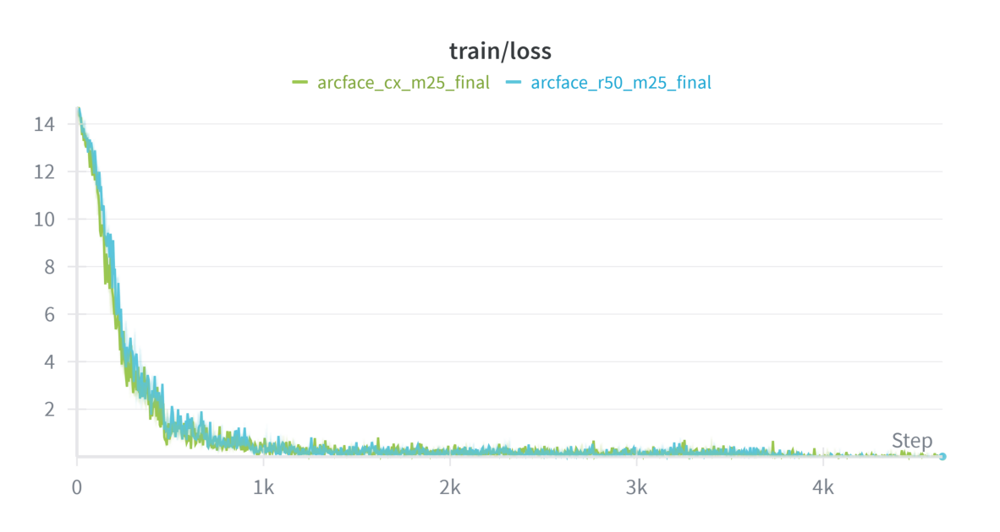

In [30]:
# Visualizing losses (ArcFace + R50/C_Tiny)
img = Image.open("/kaggle/input/images/arcface_losses.png")
plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.axis("off")
plt.show()

> As we can observe, the ArcFace model with a ConvNeXt backbone exhibits a slightly steeper convergence. This suggests that the stronger backbone produces more discriminative embeddings already in the early stages of training, allowing the angular margin loss to refine class separation more efficiently.
>
> However, faster convergence does not necessarily imply better final performance. On the contrary, it may indicate a higher tendency to overfit earlier. Indeed, the best-performing epoch identified during the validation phase is epoch 5, confirming this early peak behavior.

##### Evaluating model

In [44]:
"""ckpt_epochs = [2,3,4,5]
ckpt_paths  = [f"/kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch{e:02d}.pth" for e in ckpt_epochs]

model_reid_af_cx = ReIDNetArcFaceConvNeXt(emb_dim=emb_dim, num_classes=num_classes, s=30.0, m=0.25).to(device)

results = {}
for epoch, ckpt_path in zip(ckpt_epochs, ckpt_paths):
    ret = evaluate_checkpoint_prw(
        ckpt_path=ckpt_path,
        model=model_reid_af_cx,
        query_ds=query_ds,
        gallery_eval=gallery_eval,
        test_ds=test_ds,
        test_detections=test_detections,
        test_reid_tf=test_reid_tf,
        device=device,
    )
    results[epoch] = ret"""


[Eval] Loading checkpoint: /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch02.pth
search ranking:
  mAP = 49.35%
  top- 1 = 86.10%
[Eval] /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch02.pth → mAP=49.35% | top-1=86.10%

[Eval] Loading checkpoint: /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch03.pth
search ranking:
  mAP = 49.84%
  top- 1 = 86.29%
[Eval] /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch03.pth → mAP=49.84% | top-1=86.29%

[Eval] Loading checkpoint: /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch04.pth
search ranking:
  mAP = 49.67%
  top- 1 = 86.05%
[Eval] /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch04.pth → mAP=49.67% | top-1=86.05%

[Eval] Loading checkpoint: /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch05.pth
search ranking:
  mAP = 50.12%
  top- 1 = 86.24%
[Eval] /kaggle/working/ckpts_arcface_cx/arcface_cx_m25_final_epoch05.pth → mAP=50.12% | top-1=86.24%


> The results clearly show that improving representation capacity leads to a substantial gain in both mAP and top-1 accuracy, highlighting the central role of feature quality in person search.
>
> Indeed, replacing the backbone change leads to a substantial improvement (+5.90 mAP, +3.16 top-1), confirming that representation quality is a key factor in person search.
>
> Moreover, the performance peak observed at early epochs is consistent with the loss analysis: the stronger backbone converges faster, while prolonged training tends to introduce mild overfitting.

### Ablation #2 - Recipe matters
Here we show how a non-negligible modification of the training recipe can significantly impact the model’s performance. In particular, this ablation focuses on the choice of the loss function. Instead of relying solely on a standard classification objective, we introduce an angular-based loss to explicitly enforce larger inter-class separation and tighter intra-class compactness in the embedding space.

Indeed, in the first trial we will consider the InfoNCE loss, that optimizes at once distance from multiple negatives, with the already learned weights of ArcFace. The angular batching is achieved through sampling P identities and then K for each of them.

In [25]:
import itertools
from typing import Dict, Any, Optional, List
from torch.utils.data import Sampler

In [26]:
# ============
# P×K sampler 
# ============
class RandomIdentitySampler(Sampler):
    """
    Samples P identities, and for each identity samples K instances.
    Changes each epoch via set_epoch to avoid repeating identical batches.
    """
    def __init__(self, dataset, num_identities: int, num_instances: int, seed: int = 42):
        self.dataset = dataset
        self.P = int(num_identities)
        self.K = int(num_instances)
        self.seed = int(seed)
        self.epoch = 0

        # label -> indices
        self.index_dict = {}
        for idx in range(len(dataset)):
            _, label, _, _ = dataset[idx]  # (crop, label, pid, camid)
            lab = int(label)
            self.index_dict.setdefault(lab, []).append(idx)

        self.labels = list(self.index_dict.keys())
        self.num_samples_per_batch = self.P * self.K

        # Choose target_batches_per_epoch proportional to number of identities,
        # but independent of K and P 
        target_batches_per_epoch = max(1, len(self.labels) // self.P)
        self.length = target_batches_per_epoch * self.num_samples_per_batch
        # ----------------------------

    def set_epoch(self, epoch: int):
        self.epoch = int(epoch)

    def __len__(self):
        return self.length

    def __iter__(self):
        g = np.random.RandomState(self.seed + self.epoch)

        labels = self.labels.copy()
        g.shuffle(labels)

        batch = []
        n_yielded = 0
        for lab in labels:
            idxs = self.index_dict.get(lab, [])
            if not idxs:
                continue

            # sample K instances (with replacement if not enough)
            if len(idxs) >= self.K:
                chosen = g.choice(idxs, size=self.K, replace=False)
            else:
                chosen = g.choice(idxs, size=self.K, replace=True)

            batch.extend(chosen.tolist())

            if len(batch) == self.num_samples_per_batch:
                yield from batch
                n_yielded += len(batch)
                batch = []

                # stop once we hit the fixed epoch length
                if n_yielded >= self.length:
                    return

        # padding by resampling to keep batches/epoch constant.
        while n_yielded < self.length:
            # resample P identities
            if len(self.labels) == 0:
                return
            chosen_labs = g.choice(self.labels, size=self.P, replace=(len(self.labels) < self.P))
            batch = []
            for lab in chosen_labs:
                idxs = self.index_dict.get(int(lab), [])
                if not idxs:
                    continue
                if len(idxs) >= self.K:
                    chosen = g.choice(idxs, size=self.K, replace=False)
                else:
                    chosen = g.choice(idxs, size=self.K, replace=True)
                batch.extend(chosen.tolist())

            if len(batch) == self.num_samples_per_batch:
                yield from batch
                n_yielded += len(batch)

# ====================
# ArcFace init loader
# ====================
def load_arcface_init(model: nn.Module, arc_ckpt_path: str, verbose: bool = True) -> int:
    ckpt = torch.load(arc_ckpt_path, map_location="cpu")
    arc_state = ckpt["model"] if isinstance(ckpt, dict) and "model" in ckpt else ckpt

    model_state = model.state_dict()
    filtered = {k: v for k, v in arc_state.items() if k in model_state and v.shape == model_state[k].shape}

    model_state.update(filtered)
    model.load_state_dict(model_state)

    if verbose:
        print(f"[INIT] Loaded {len(filtered)}/{len(model_state)} params from {arc_ckpt_path}")
    return len(filtered)


@torch.no_grad()
def angular_batch_stats(emb: torch.Tensor, labels: torch.Tensor, eps: float = 1e-7):
    """
    emb: (B,D) normalized
    labels: (B,)
    Returns: pos_angle_mean, neg_angle_mean, valid_frac (of anchors)
    """
    B = emb.size(0)
    if B < 2:
        return 0.0, 0.0, 0.0

    cos = (emb @ emb.t()).clamp(-1.0 + eps, 1.0 - eps)
    theta = torch.acos(cos)

    same = labels.unsqueeze(0) == labels.unsqueeze(1)
    eye = torch.eye(B, dtype=torch.bool, device=emb.device)

    pos_mask = same & ~eye
    neg_mask = ~same

    theta_pos = theta.masked_select(pos_mask)
    theta_neg = theta.masked_select(neg_mask)

    # batch-hard valid anchors fraction
    theta_pos_mat = theta.masked_fill(~pos_mask, float("-inf"))
    theta_neg_mat = theta.masked_fill(~neg_mask, float("inf"))
    hardest_pos = theta_pos_mat.max(dim=1).values
    hardest_neg = theta_neg_mat.min(dim=1).values
    valid = (hardest_pos > float("-inf")) & (hardest_neg < float("inf"))
    valid_frac = valid.float().mean().item()

    pos_mean = theta_pos.mean().item() if theta_pos.numel() else 0.0
    neg_mean = theta_neg.mean().item() if theta_neg.numel() else 0.0
    return pos_mean, neg_mean, valid_frac

In [27]:
class ReIDNetEmbed(nn.Module):
    """
    Same arch. of ReIDNet, but w/out classifier head.
    Returns L2-normalized embedding with shape (batch_size, emb_dim)
    """
    def __init__(self, emb_dim: int = 512):
        super().__init__()
        backbone = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        self.backbone = nn.Sequential(*list(backbone.children())[:-2])
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(2048, emb_dim)

    def forward(self, x):
        f = self.backbone(x)
        f = self.pool(f).flatten(1)
        z = self.fc(f)
        z = F.normalize(z, dim=1) 
        return z

class SupInfoNCELoss(nn.Module):
    def __init__(self, temperature: float = 0.07, eps: float = 1e-8):
        super().__init__()
        self.tau = float(temperature)
        self.eps = float(eps)

    def forward(self, emb: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        B = emb.size(0)
        if B < 2:
            return emb.sum() * 0.0

        # emb is expected float32 here
        emb = F.normalize(emb, dim=1)
        labels = labels.view(-1).long()
        device = emb.device

        logits = (emb @ emb.t()) / self.tau  # float32
        eye = torch.eye(B, dtype=torch.bool, device=device)

        # for safety
        logits = logits.masked_fill(eye, -1e9)

        lab = labels.view(-1, 1)
        pos_mask = (lab == lab.t()) & (~eye)
        pos_count = pos_mask.sum(dim=1)

        valid = pos_count > 0
        if valid.sum() == 0:
            return emb.sum() * 0.0

        log_prob = F.log_softmax(logits, dim=1)
        pos_log_prob_sum = (log_prob * pos_mask.float()).sum(dim=1)
        loss_i = -pos_log_prob_sum / (pos_count.float() + self.eps)

        return loss_i[valid].mean()

In [60]:
def train_one_supinfonce(
    cfg: Dict[str, Any],
    train_reid_ds,
    val_reid_ds,
    device: str,
    num_workers: int = 2,
    use_amp: bool = True,
    wandb_project: str = "person re-id valsplit",
    wandb_entity: str = "unibo-ai",
    run_name_prefix: str = "reid_r50_supinfonce",
    save_dir: str = "./ckpts_supinfonce",
    save_every: int = 5,
):
    """
    ArcFace init (optional) + Supervised InfoNCE
    - Warmup: per-iteration (manual LR ramp)
    - MultiStepLR: per-epoch
    - Validation each epoch (loss + 1NN proxy + angle stats)
    """

    # -------------------- SEED --------------------
    seed = int(cfg.get("seed", 42))
    torch.manual_seed(seed)
    np.random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # -------------------- LOADERS --------------------
    P, K = int(cfg["P"]), int(cfg["K"])
    batch_size = P * K

    train_sampler = RandomIdentitySampler(train_reid_ds, P, K, seed)

    train_loader = DataLoader(
        train_reid_ds,
        batch_size=batch_size,
        sampler=train_sampler,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=True,
    )
    if val_reid_ds is not None:
        val_sampler = RandomIdentitySampler(val_reid_ds,   P, K, seed + 999)
        val_loader = DataLoader(
            val_reid_ds,
            batch_size=batch_size,
            sampler=val_sampler,
            shuffle=False,
            num_workers=num_workers,
            pin_memory=True,
            drop_last=True,
        )

    steps_per_epoch = len(train_loader)
    warmup_steps = max(1, int(cfg["warmup_epochs"]) * steps_per_epoch)

    # -------------------- MODEL --------------------
    emb_dim = int(cfg.get("emb_dim", 512))
    model = ReIDNetEmbed(emb_dim=emb_dim).to(device)

    name_run = f"{run_name_prefix}_P{P}K{K}_tau{int(cfg['temperature']*1000)}"

    # optional init from ArcFace checkpoint
    if cfg.get("init_from_arcface", False):
        load_arcface_init(model, cfg["arc_ckpt_path"])
        name_run = f"{run_name_prefix}_af_P{P}K{K}_tau{int(cfg['temperature']*1000)}"

    # -------------------- LOSS / OPT --------------------
    loss_fn = SupInfoNCELoss(temperature=float(cfg["temperature"])).to(device)

    base_lr = float(cfg["lr"])
    eta_min = float(cfg.get("eta_min", 1e-6))
    weight_decay = float(cfg["weight_decay"])

    optimizer = torch.optim.AdamW(model.parameters(), lr=base_lr, weight_decay=weight_decay)

    # start from eta_min (warmup ramps to base_lr)
    for pg in optimizer.param_groups:
        pg["lr"] = eta_min

    # MultiStepLR per-epoch
    step_scheduler = torch.optim.lr_scheduler.MultiStepLR(
        optimizer,
        milestones=list(cfg["milestones"]),
        gamma=float(cfg["gamma"]),
    )

    scaler = torch.amp.GradScaler("cuda", enabled=use_amp)

    # -- WANDB --
    wandb.init(
        entity=wandb_entity,
        project=wandb_project,
        config=cfg,
        name=name_run,
        reinit=True,
    )

    os.makedirs(save_dir, exist_ok=True)

    global_step = 0

    # -- TRAIN LOOP --
    for epoch in range(int(cfg["epochs"])):
        model.train()
        train_sampler.set_epoch(epoch)
        if val_reid_ds is not None:
            val_sampler.set_epoch(epoch)

        epoch_loss_sum = 0.0
        n_batches = 0
        acc_sum, n_acc = 0.0, 0
        pos_sum, neg_sum, valid_sum, n_stat = 0.0, 0.0, 0.0, 0

        t0 = time.time()

        for crops, labels, _, _ in train_loader:
            crops  = crops.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True).view(-1).long()

            # warmup per-step (manual)
            if global_step < warmup_steps:
                warm = (global_step + 1) / warmup_steps
                lr_now = eta_min + warm * (base_lr - eta_min)
                for pg in optimizer.param_groups:
                    pg["lr"] = lr_now

            optimizer.zero_grad(set_to_none=True)

            with autocast(device_type="cuda", enabled=use_amp):
                emb = model(crops)             # (B,D) normalized
            loss = loss_fn(emb.float(), labels)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # stats
            with torch.no_grad():
                loss_val = float(loss.item())
                lr_now = optimizer.param_groups[0]["lr"]

                sim = emb @ emb.t()
                B = sim.size(0)
                if B >= 2:
                    sim.fill_diagonal_(-1e9)
                    nn_idx = sim.argmax(dim=1)
                    nn_labels = labels[nn_idx]
                    acc_batch = (nn_labels == labels).float().mean().item()
                else:
                    acc_batch = 0.0

                pos_m, neg_m, valid_frac = angular_batch_stats(emb, labels)

            epoch_loss_sum += loss_val
            n_batches += 1
            acc_sum += acc_batch
            n_acc += 1
            pos_sum += pos_m
            neg_sum += neg_m
            valid_sum += valid_frac
            n_stat += 1

            wandb.log(
                {
                    "epoch": epoch,
                    "step": global_step,
                    "train/loss_step": loss_val,
                    "train/lr": lr_now,
                    "train/1nn_acc_batch": acc_batch,
                    "train/pos_angle_mean": pos_m,
                    "train/neg_angle_mean": neg_m,
                    "train/valid_anchor_frac": valid_frac,
                },
                step=global_step,
            )

            global_step += 1

        train_loss = epoch_loss_sum / max(1, n_batches)
        train_acc  = acc_sum / max(1, n_acc)
        train_pos  = pos_sum / max(1, n_stat)
        train_neg  = neg_sum / max(1, n_stat)
        train_valid = valid_sum / max(1, n_stat)

        # MultiStepLR per-epoch
        if (epoch + 1) > int(cfg["warmup_epochs"]):
            step_scheduler.step()

        # -- VALIDATION --
        if val_reid_ds is not None:
            val_stats = eval_infonce_val_epoch(
                model=model,
                loss_fn=loss_fn,
                val_loader=val_loader,
                device=device,
                use_amp=use_amp,
            )
    
            dt = time.time() - t0
    
            wandb.log(
                {
                    "epoch": epoch,
                    "train/loss_epoch": train_loss,
                    "train/1nn_acc_epoch": train_acc,
                    "train/pos_angle_mean_epoch": train_pos,
                    "train/neg_angle_mean_epoch": train_neg,
                    "train/valid_anchor_frac_epoch": train_valid,
                    "val/loss": val_stats["loss"],
                    "val/1nn_acc": val_stats["1nn_acc"],
                    "val/pos_angle_mean": val_stats["pos_angle_mean"],
                    "val/neg_angle_mean": val_stats["neg_angle_mean"],
                    "val/valid_anchor_frac": val_stats["valid_anchor_frac"],
                    "lr": optimizer.param_groups[0]["lr"],
                    "time/epoch_sec": dt,
                }
            )
    
            print(
                f"[Epoch {epoch:02d}] "
                f"train_loss={train_loss:.4f} | val_loss={val_stats['loss']:.4f} | "
                f"val_1NN={val_stats['1nn_acc']:.4f} | lr={optimizer.param_groups[0]['lr']:.2e} | {dt:.1f}s"
            )

        # -- SAVING CHECKPOINTS --
        if (epoch + 1) % int(save_every) == 0:
            tag = "af" if cfg.get("init_from_arcface", False) else "scratch"
            ckpt_path = os.path.join(
                save_dir,
                f"{run_name_prefix}_{tag}_P{P}K{K}_tau{int(cfg['temperature']*1000)}_epoch{epoch+1:02d}.pth"
            )
            torch.save(
                {
                    "epoch": epoch + 1,
                    "global_step": global_step,
                    "model": model.state_dict(),
                    "optimizer": optimizer.state_dict(),
                    "step_scheduler": step_scheduler.state_dict(),
                    "scaler": scaler.state_dict() if use_amp else None,
                    "config": cfg,
                    "P": P,
                    "K": K,
                },
                ckpt_path,
            )
            print(f"[CKPT] Saved {ckpt_path}")

    wandb.finish()

In [ ]:
base = dict(
    lr=3e-4,
    weight_decay=1e-4,
    epochs=20,
    warmup_epochs=1,
    eta_min=1e-6,
    milestones=[16],
    gamma=0.1,
    seed=42,
    emb_dim=512,
    P=16,
    K=4,
    temperature=0.05,
    init_from_arcface=True,
    arc_ckpt_path="/kaggle/input/final-reid-weights/arcface_r50_m25_final_epoch20.pth",
)
"""
out_af_nce = train_one_supinfonce(
    cfg=base,
    train_reid_ds=trainval_reid_ds,
    val_reid_ds=None,
    device=device,
    num_workers=2,
    use_amp=True,
    wandb_project="person re-id valsplit",
    wandb_entity = "unibo-ai",
    run_name_prefix = "supinfonce_af_P16K4_tau50_final",
    save_dir = "./ckpts_supinfonce",
    save_every = 5,
)"""

[INIT] Loaded 320/320 params from /kaggle/input/final-arcface-r50-w/arcface_r50_m25_final_epoch20.pth


[CKPT] Saved ./ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch05.pth
[CKPT] Saved ./ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch10.pth
[CKPT] Saved ./ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch15.pth
[CKPT] Saved ./ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch20.pth


epoch,▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▇▇▇▇█████
step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇███
train/1nn_acc_batch,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss_step,█▇▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▂▁▁▂▂▁▁▁▂▁▁▁▁▁▃▁
train/lr,▁▆▇█████████████████████████████████▁▁▁▁
train/neg_angle_mean,█▂▁▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
train/pos_angle_mean,█▇▆▅▃▄▃▃▂▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▂▂▂▂▂▁▂▂▁▂▁▁
train/valid_anchor_frac,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,19
step,599
train/1nn_acc_batch,1


In [46]:
# Evaluate
"""ckpt_epochs = [20, 5, 10, 15]
ckpt_paths  = [f"/kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch{e:02d}.pth" for e in ckpt_epochs]

model_reid_infonce = ReIDNetEmbed(emb_dim=emb_dim).to(device)

results = {}
for epoch, ckpt_path in zip(ckpt_epochs, ckpt_paths):
    ret = evaluate_checkpoint_prw(
        ckpt_path=ckpt_path,
        model=model_reid_infonce,
        query_ds=query_ds,
        gallery_eval=gallery_eval,
        test_ds=test_ds,
        test_detections=test_detections,
        test_reid_tf=test_reid_tf,
        device=device,
    )
    results[epoch] = ret"""


[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch20.pth
search ranking:
  mAP = 44.82%
  top- 1 = 80.46%
[Eval] /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch20.pth → mAP=44.82% | top-1=80.46%

[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch05.pth
search ranking:
  mAP = 46.26%
  top- 1 = 82.94%
[Eval] /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch05.pth → mAP=46.26% | top-1=82.94%

[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch10.pth
search ranking:
  mAP = 45.73%
  top- 1 = 81.96%
[Eval] /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch10.pth → mAP=45.73% | top-1=81.96%

[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/reid_r50_supinfonce_af_P16K4_tau50_epoch15.pth
search ranking:
  mAP = 45.63%
  top- 1 = 80.85%
[Eval] /kaggle/working/ckpt

> The contrastive fine-tuning peaks early (epoch 5), after which both mAP and top-1 gradually decrease, suggesting overfitting. This motivates early stopping (or stronger regularization) for the InfoNCE stage.


> From these results, we can see how the model selection at **validation** time is correct and generalizes well at **test** time

#### InfoNCE + ArcFace + ConvNeXt
This second ablation investigates whether the contrastive fine-tuning strategy (ArcFace -> InfoNCE), which showed improvements on ResNet50, remains effective when applied to a stronger backbone such as ConvNeXt.

The key question is whether the insights observed during validation transfer consistently to this higher-capacity model, or whether the additional contrastive optimization disrupts the already well-structured embedding space, potentially leading to degraded generalization compared to the ArcFace-only ConvNeXt baseline.

Here we have to run up to **20** epochs, according to **validation** runs insights.

In [73]:
base = dict(
    lr=3e-4,
    weight_decay=1e-4,
    epochs=20,
    warmup_epochs=1,
    eta_min=1e-6,
    milestones=[16],
    gamma=0.1,
    seed=42,
    emb_dim=512,
    P=16,
    K=4,
    temperature=0.05,
    init_from_arcface=True,
    arc_ckpt_path="/kaggle/input/final-reid-weights/arcface_cx_m25_final_epoch05.pth",
)
"""
out_af_nce = train_one_supinfonce(
    cfg=base,
    train_reid_ds=trainval_reid_ds,
    val_reid_ds=None,
    device=device,
    num_workers=2,
    use_amp=True,
    wandb_project="person re-id valsplit",
    wandb_entity = "unibo-ai",
    run_name_prefix = "supinfonce_af_cx_P16K4_tau50_final",
    save_dir = "./ckpts_supinfonce",
    save_every = 5,
)"""

[INIT] Loaded 1/320 params from /kaggle/input/final-reid-weights/arcface_cx_m25_final_epoch05.pth


[CKPT] Saved ./ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch05.pth
[CKPT] Saved ./ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch10.pth
[CKPT] Saved ./ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch15.pth
[CKPT] Saved ./ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch20.pth


epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇███
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇███
train/1nn_acc_batch,▁▁▅▆▄▆▇▇▆▆▆▇▇▆▇█▇██▇██▇██▇██████████████
train/loss_step,█▆▅▆▄▃▃▃▂▃▂▂▂▂▂▂▂▂▁▃▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁
train/lr,▂▄███████████████████████████████▁▁▁▁▁▁▁
train/neg_angle_mean,█▅▅▄▁▂▂▃▄▂▅▄▃▄▄▃▄▅▄▄▄▃▃▄▂▂▃▄▄▅▅▄▅▅▃▅▅▆▄▅
train/pos_angle_mean,██▇▄▅▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▁▂▂▁▂▁▂▂▁▂▁▁▂
train/valid_anchor_frac,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,19
step,599
train/1nn_acc_batch,1


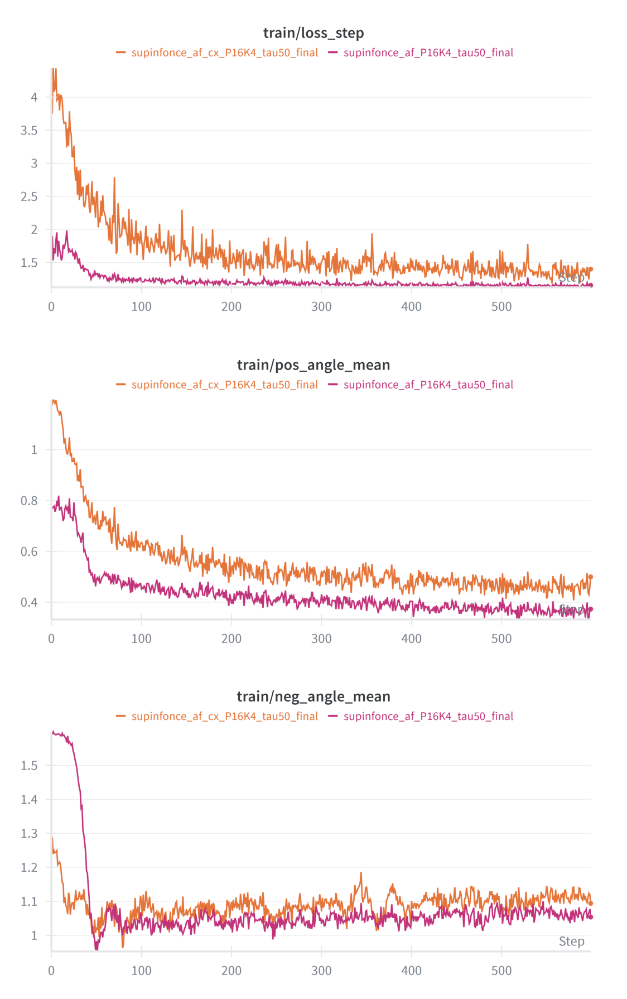

In [38]:
# Visualize loss and other metrics for contrastive fine-tuning on ArcFace with R50 and C_Tiny
img_loss = Image.open("/kaggle/input/images/infonce_cx_vs_r50_loss.png")
img_pos_angle = Image.open("/kaggle/input/images/infonce_cx_vs_r50_pos_angle_mean.png")
img_neg_angle = Image.open("/kaggle/input/images/infonce_cx_vs_r50_loss_neg_angle_mean.png")
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 18))
ax[0].imshow(img_loss)
ax[0].axis("off")
ax[1].imshow(img_pos_angle)
ax[1].axis("off")
ax[2].imshow(img_neg_angle)
ax[2].axis("off")
plt.tight_layout()
plt.show()

> The loss plot shows that the model trained with contrastive fine-tuning on ResNet50 (CFR50) exhibits a noticeably steeper convergence compared to the one trained on ConvNeXt-Tiny (CFCT). This suggests that the contrastive objective stabilizes more quickly when applied to the ResNet backbone, leading to faster optimization dynamics.
> 
> The positive angle mean plot indicates that CFR50 achieves consistently lower positive angular distances, meaning that samples belonging to the same identity are more tightly clustered in the embedding space. In contrast, CFCT maintains higher positive angles, suggesting less compact intra-class representations.
>
> The negative angle mean plot shows that the separation between positive and negative samples is overall comparable across the two models. CFCT slightly increases the average negative angle, but this appears to come at the cost of higher intra-class dispersion. Therefore, while CFCT pushes negatives marginally further apart, CFR50 achieves a better balance between intra-class compactness and inter-class separation.

In [74]:
# Evaluate
"""ckpt_epochs = [20, 5, 10, 15]
ckpt_paths  = [f"/kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch{e:02d}.pth" for e in ckpt_epochs]

model_reid_infonce = ReIDNetEmbed(emb_dim=emb_dim).to(device)

results = {}
for epoch, ckpt_path in zip(ckpt_epochs, ckpt_paths):
    ret = evaluate_checkpoint_prw(
        ckpt_path=ckpt_path,
        model=model_reid_infonce,
        query_ds=query_ds,
        gallery_eval=gallery_eval,
        test_ds=test_ds,
        test_detections=test_detections,
        test_reid_tf=test_reid_tf,
        device=device,
    )
    results[epoch] = ret"""


[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch20.pth
search ranking:
  mAP = 41.44%
  top- 1 = 77.83%
[Eval] /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch20.pth → mAP=41.44% | top-1=77.83%

[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch05.pth
search ranking:
  mAP = 31.76%
  top- 1 = 74.14%
[Eval] /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch05.pth → mAP=31.76% | top-1=74.14%

[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch10.pth
search ranking:
  mAP = 35.93%
  top- 1 = 75.89%
[Eval] /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_final_af_P16K4_tau50_epoch10.pth → mAP=35.93% | top-1=75.89%

[Eval] Loading checkpoint: /kaggle/working/ckpts_supinfonce/supinfonce_af_cx_P16K4_tau50_fina

> As observed during validation, contrastive fine-tuning applied to a stronger backbone does not lead to the expected improvements. This behavior may be related to over-regularization or to an imbalance introduced by the contrastive objective when the underlying representation is already highly expressive.
>
> In particular, the current contrastive fine-tuning setup (temperature, sampling strategy, and regularization choices) may not be sufficiently robust when applied to a strong backbone such as ConvNeXt-Tiny.

### Considerations on quantitative results

While contrastive fine-tuning (InfoNCE) improves ranking performance on a ResNet backbone, applying the same recipe to a stronger ConvNeXt backbone leads to overfitting and poor test generalization. As a result, **ArcFace + ConvNeXt is selected as the final model.**

All the results can be summarized with the following table, where we consider the best epoch for each model:

| Model               | Backbone          | Training recipe      | Epoch |       mAP |     Top-1 |
| ------------------- | ----------------- | -------------------- | ----: | --------: | --------: |
| ArcFace             | ResNet50          | ArcFace              |    20 |     0.442 |     0.831 |
| **ArcFace (final)** | **ConvNeXt-Tiny** | **ArcFace**          | **5** | **0.509** | **0.863** |
| ArcFace → InfoNCE   | ResNet50          | ArcFace + SupInfoNCE |     5 |     0.463 |     0.829 |
| ArcFace → InfoNCE   | ConvNeXt-Tiny     | ArcFace + SupInfoNCE |    20 |     0.414 |     0.778 |

Some insights:

- **Backbone ablation**: ConvNeXt-Tiny consistently outperforms ResNet50 under the same ArcFace training, with large gains in both validation and test.

- **Recipe ablation**: Contrastive fine-tuning (InfoNCE) improves mAP on ResNet50 but does not generalize on ConvNeXt, leading to degraded test performance.

### Visual proof
We now analyze the performance of the proposed models from a qualitative perspective. In particular, we inspect retrieval results to better understand how different backbones and training strategies affect identity matching behavior beyond quantitative metrics.

We first analyze a **randomly** selected query for each model to provide an unbiased qualitative overview. We then conduct a deeper analysis by focusing on particularly **informative** cases, identified by comparing the differences in predictions between the models.

In [ ]:
def get_font(size=18):
    try:
        return ImageFont.truetype(
            "/usr/share/fonts/truetype/liberation/LiberationMono-Regular.ttf", size
        )
    except Exception:
        return ImageFont.load_default()

def compute_iou_xyxy(a, b):
    x1 = max(float(a[0]), float(b[0]))
    y1 = max(float(a[1]), float(b[1]))
    x2 = min(float(a[2]), float(b[2]))
    y2 = min(float(a[3]), float(b[3]))
    inter = max(0.0, x2 - x1) * max(0.0, y2 - y1)
    union = (float(a[2]) - float(a[0])) * (float(a[3]) - float(a[1])) + \
            (float(b[2]) - float(b[0])) * (float(b[3]) - float(b[1])) - inter + 1e-9
    return inter / union

def draw_bbox_with_text(img_pil, xyxy, text_lines, color=(255, 0, 0), width=3):
    img = img_pil.copy()
    draw = ImageDraw.Draw(img)
    font = get_font(18)

    x1, y1, x2, y2 = [float(v) for v in xyxy]
    draw.rectangle([x1, y1, x2, y2], outline=color, width=width)

    pad = 2
    text = "\n".join(text_lines)
    bbox = draw.multiline_textbbox((0, 0), text, font=font)
    tw, th = bbox[2] - bbox[0], bbox[3] - bbox[1]
    draw.rectangle([x1, y1, x1 + tw + 2*pad, y1 + th + 2*pad], fill=color)
    draw.multiline_text((x1 + pad, y1 + pad), text, fill="black", font=font)
    return img

def visualize_person_search(
    query_idx: int,
    gallery_eval,             # gallery_eval.annotations: list of dict
    query_ds,                 # query_ds.annotations: list of dict
    gallery_dets,             # list[np.ndarray] each (Nd, 5) => [x1,y1,x2,y2,score]
    gallery_feats,            # list[np.ndarray] each (Nd, D)
    query_box_feats,          # list[np.ndarray] each (D,)
    det_thresh: float = 0.3,
    topk_images: int = 10,    # number of gallery IMAGES to show
    ignore_cam_id: bool = True,
    query_box_dir: str = query_imgs_path,
    frames_dir: str = path_imgs,
    figsize=(18, 10),
):
    """
    Visualize person search results for a given query index.
    Shows the query image and top-k gallery images with their best detection, similarity score, and TP/FP status.
     - TP@1: best box is correct (orange)
     - TP@any: correct exists but not best (green)
     - FP: no correct box (red)
     - Missed GT (red, no box) if query GT exists in that gallery image
    """
    assert 0 <= query_idx < len(query_ds.annotations)
    assert len(gallery_eval.annotations) == len(gallery_dets) == len(gallery_feats)
    assert len(query_box_feats) == len(query_ds.annotations)

    # -- query metadata --
    q_anno = query_ds.annotations[query_idx]
    q_pid = int(np.asarray(q_anno["pids"]).ravel()[0])
    q_cam = int(q_anno["cam_id"])
    q_img_name = q_anno["img_name"]
    q_stem = osp.splitext(q_img_name)[0]

    q_path = osp.join(query_box_dir, f"{q_pid}_{q_stem}.jpg")
    q_img = Image.open(q_path).convert("RGB")

    q_feat = np.asarray(query_box_feats[query_idx]).reshape(-1).astype(np.float32)

    # -- pre-filter detections by det_thresh --
    annos = gallery_eval.annotations
    name_to_det_feat = {}
    for anno, det, feat in zip(annos, gallery_dets, gallery_feats):
        name = anno["img_name"]
        if det is None or len(det) == 0:
            continue
        det = np.asarray(det)
        feat = np.asarray(feat)
        scores = det[:, 4].ravel()
        inds = np.where(scores >= det_thresh)[0]
        if len(inds) > 0:
            name_to_det_feat[name] = (det[inds], feat[inds])

    # build query ground truths
    gallery_imgs_with_pid = []
    for x in annos:
        if (q_pid in x["pids"]) and (x["img_name"] != q_img_name):
            gallery_imgs_with_pid.append(x)

    query_gts = {}
    for item in gallery_imgs_with_pid:
        # item["boxes"] aligned with item["pids"]
        query_gts[item["img_name"]] = item["boxes"][item["pids"] == q_pid]

    # construct gallery set for the given query
    if ignore_cam_id:
        gallery_imgs = [x for x in annos if x["img_name"] != q_img_name]
    else:
        gallery_imgs = [x for x in annos if (x["img_name"] != q_img_name) and (x["cam_id"] != q_cam)]

    # compute per-image ranking info
    ranked_imgs = []
    for item in gallery_imgs:
        g_name = item["img_name"]
        if g_name not in name_to_det_feat:
            continue

        det, feat_g = name_to_det_feat[g_name]
        det = np.asarray(det)
        feat_g = np.asarray(feat_g).reshape(len(det), -1).astype(np.float32)

        sims = feat_g.dot(q_feat).ravel()  # cosine if normalized
        order = np.argsort(sims)[::-1]
        sims_s = sims[order]
        det_s = det[order]

        # rank-1 prediction
        best_sim = float(sims_s[0])
        best_box = det_s[0, :4]
        best_score = float(det_s[0, 4])

        # TP/FP computation
        state = "FP"
        iou_thresh = None
        match_rank = None
        match_iou = None

        if g_name in query_gts:
            gt = np.asarray(query_gts[g_name]).ravel()  # xyxy
            w, h = float(gt[2] - gt[0]), float(gt[3] - gt[1])
            iou_thresh = min(0.5, (w * h * 1.0) / ((w + 10.0) * (h + 10.0)))

            # find 1st matched det in similarity order
            for j, roi in enumerate(det_s[:, :4]):
                iou = compute_iou_xyxy(roi, gt)
                if iou >= iou_thresh:
                    match_rank = j
                    match_iou = float(iou)
                    break

            if match_rank is None:
                state = "FP"         # (red bbox) missed person in this image
            elif match_rank == 0:
                state = "TP@1"       # (orange bbox) best box is correct
            else:
                state = "TP@any"     # (green bbox) correct exists, but rank-1 is wrong

        ranked_imgs.append({
            "img_name": g_name,
            "best_sim": best_sim,
            "best_box": best_box,
            "best_det_score": best_score,
            "state": state,
            "iou_thresh": iou_thresh,
            "match_rank": match_rank,
            "match_iou": match_iou,
        })

    ranked_imgs.sort(key=lambda d: d["best_sim"], reverse=True)
    ranked_show = ranked_imgs[:topk_images]

    # -- plot --
    n = len(ranked_show)
    ncols = 2
    nrows = int(np.ceil((n + 1) / ncols))

    plt.figure(figsize=figsize)

    ax = plt.subplot(nrows, ncols, 1)
    ax.imshow(q_img)
    ax.set_title(f"QUERY idx={query_idx}\npid={q_pid} cam={q_cam}", fontsize=10)
    ax.axis("off")

    for i, r in enumerate(ranked_show, start=2):
        g_name = r["img_name"]
        g_path = osp.join(frames_dir, g_name)
        g_img = Image.open(g_path).convert("RGB")

        if r["state"] == "TP@1":
            color = (0, 255, 0)      # green
        elif r["state"] == "TP@any":
            color = (255, 165, 0)    # orange
        else:
            color = (255, 0, 0)      # red

        tag = r["state"]
        extra = []
        if r["iou_thresh"] is not None:
            extra.append(f"t={r['iou_thresh']:.3f}")
        if r["match_rank"] is not None:
            extra.append(f"match@{r['match_rank']+1} iou={r['match_iou']:.2f}")

        text_lines = [
            f"pid={q_pid} {tag}",
            #f"sim={r['best_sim']:.3f}",
            #f"det={r['best_det_score']:.2f}",
        ] 

        g_img = draw_bbox_with_text(g_img, r["best_box"], text_lines, color=color, width=3)

        ax = plt.subplot(nrows, ncols, i)
        ax.imshow(g_img)
        ax.set_title(g_name, fontsize=8)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    return ranked_imgs 

In [43]:
def load_reid_model(model_class, weights_reid_path, num_classes, emb_dim=512):
    # instantiate model
    model = model_class( 
        emb_dim=emb_dim,
        num_classes=num_classes,
        s=.30,
        m=.25,
    ).to(device)
    
    # load weights
    ckpt_reid = torch.load(weights_reid_path, map_location="cpu")
    
    # load weights into model
    model.load_state_dict(ckpt_reid["model"], strict=True)
    model.to(device)
    model.eval()   # inference mode 

    return model

# compute feature embeddings
def compute_emb_feats_model(model, test_set, test_detections, test_transform, device):
    query_feats = compute_query_box_feats_from_querybox(
            reid_model=model,
            query_info_path=query_info_path,
            query_box_dir=query_imgs_path,
            transform=test_transform,
            device=device,
        )
    test_gallery_feats = build_gallery_feats(
        reid_model=model,
        prw_dataset=test_set,
        detections=test_detections,
        transform=test_transform,
        device=device,
    )
    return query_feats, test_gallery_feats

#### Random query

##### ArcFace with ResNet50

In [ ]:
weights_path = "/kaggle/input/final-reid-weights/arcface_r50_m25_final_epoch20.pth"
model_reid_af = load_reid_model(model_class=ReIDNetArcFace, weights_reid_path=weights_path, num_classes=num_classes)

query_feats, test_gallery_feats = compute_emb_feats_model(
     model=model_reid_af,
     test_set=test_ds,
     test_detections=test_detections,
     test_transform=test_reid_tf,
     device=device
    )

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 209MB/s]


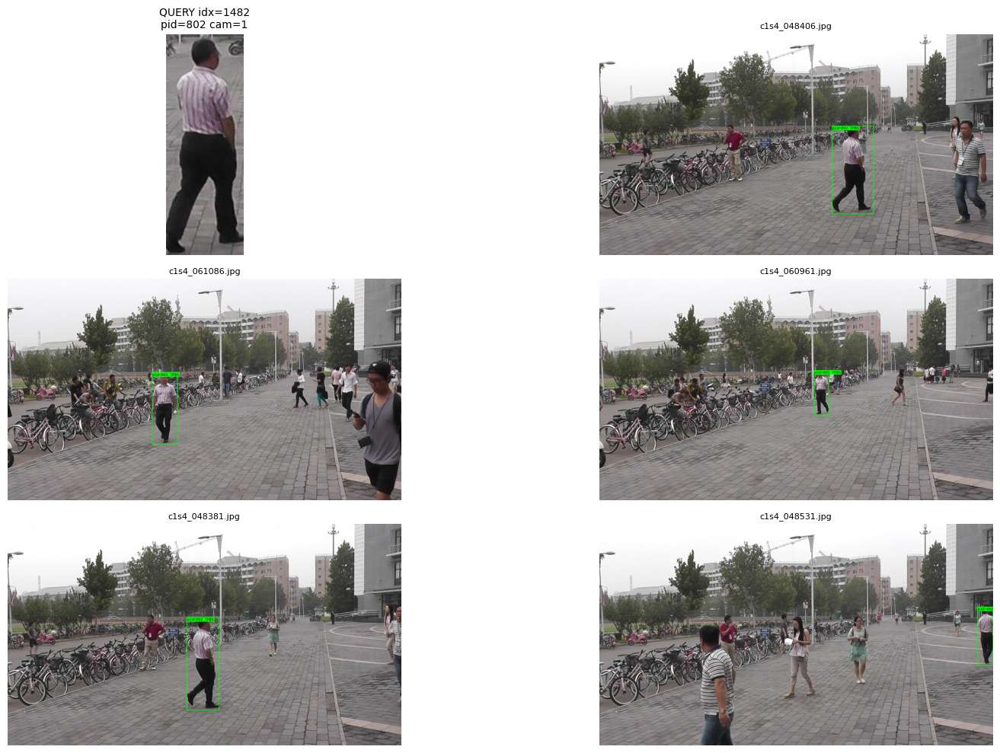

In [57]:
# choose a random query
list_queries = os.listdir(query_imgs_path)
rnd_idx = np.random.randint(len(list_queries))

# query search over gallery and viz 
ranked_af = visualize_person_search(
    query_idx=rnd_idx,
    gallery_eval=gallery_eval,
    query_ds=query_ds,
    gallery_dets=test_detections,
    gallery_feats=test_gallery_feats,
    query_box_feats=query_feats,
    det_thresh=0.3,
    topk_images=5,
    ignore_cam_id=True,
)

> Although the baseline model retrieves all ground-truth matches within the top ranks, the ordering appears less semantically consistent (with the respect the one we will see for the ConvNeXt model). In particular, visually clearer more similar to the query subject are sometimes ranked below less prominent instances.

##### ArcFace with ConvNeXt-Tiny

In [48]:
# instantiate and load model
weights_path_cx = "/kaggle/input/final-weights/arcface_cx_m25_final_epoch05.pth"
model_reid_af_cx = load_reid_model(model_class=ReIDNetArcFaceConvNeXt, weights_reid_path=weights_path_cx, num_classes=num_classes)

# compute feature embeddings
query_feats_cx, test_gallery_feats_cx = compute_emb_feats_model(
     model=model_reid_af_cx,
     test_set=test_ds,
     test_detections=test_detections,
     test_transform=test_reid_tf,
     device=device
    )

Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 206MB/s] 


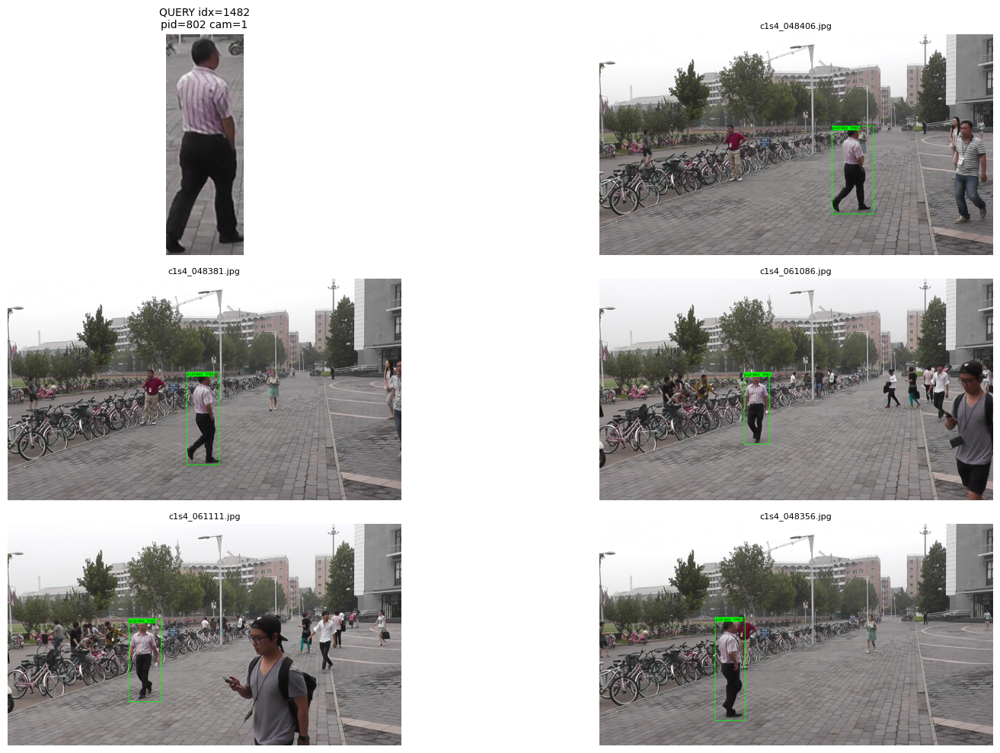

In [58]:
# choose a random query
list_queries = os.listdir(query_imgs_path)

# query search over gallery and viz 
ranked_af_cx = visualize_person_search(
    query_idx=rnd_idx,
    gallery_eval=gallery_eval,
    query_ds=query_ds,
    gallery_dets=test_detections,
    gallery_feats=test_gallery_feats_cx,
    query_box_feats=query_feats_cx,
    det_thresh=0.3,
    topk_images=5,
    ignore_cam_id=True,
)

> In contrast, the ConvNeXt-based model produces a more coherent ranking, prioritizing clearer and more discriminative appearances of the subject. This suggests that the stronger backbone yields embeddings that better capture identity-relevant features rather than relying primarily on coarse visual similarity.

#### A further, more detailed analysis
Here we make a deeper comparison between the baseline and our best model, that is the ArcFace + ConvNeXt. We will find those queries for which our models differ in the prediction and we will visaully inspect them, to understand where the mismatch arises.

With this first block of code, we will find the most informative queries:

In [ ]:
from collections import defaultdict

# ------
# Utils
# ------
def l2norm(x, eps=1e-12):
    """
    L2-normaliziation
    """
    x = np.asarray(x, dtype=np.float32)
    if x.ndim == 1:
        return x / (np.linalg.norm(x) + eps)
    return x / (np.linalg.norm(x, axis=1, keepdims=True) + eps)

def iou_thresh_from_gt(gt_xyxy):
    """
    Compute the adaptive IoU threshold used in PRW-style evaluation.
    The threshold depends on the GT box size and is capped at 0.5.
    """
    gt = np.asarray(gt_xyxy, dtype=np.float32).reshape(4,)
    w = float(gt[2] - gt[0])
    h = float(gt[3] - gt[1])
    return float(min(0.5, (w*h) / ((w+10.0)*(h+10.0))))

def draw_boxes(img_pil, boxes_xyxy, color=(0, 128, 255), width=2):
    """
    Draw bounding boxes on a PIL image.
    """
    img = img_pil.copy()
    draw = ImageDraw.Draw(img)
    boxes = np.asarray(boxes_xyxy, dtype=np.float32).reshape(-1, 4)
    for b in boxes:
        x1, y1, x2, y2 = [float(v) for v in b]
        draw.rectangle([x1, y1, x2, y2], outline=color, width=width)
    return img

def max_iou_with_gts(box_xyxy, gts_xyxy):
    """
    Compute the maximum IoU between a detection and all GTs
    """
    gts = np.asarray(gts_xyxy, dtype=np.float32).reshape(-1, 4)
    best_iou = -1.0
    best_k = None
    for k, gt in enumerate(gts):
        iou = compute_iou_xyxy(box_xyxy, gt)
        if iou > best_iou:
            best_iou = iou
            best_k = k
    if best_k is None:
        return None, None, None
    thr = iou_thresh_from_gt(gts[best_k])
    return float(best_iou), int(best_k), float(thr)

# ---------------------
# Candidate selection 
# ---------------------
def build_gallery_pid_index(gallery_annos):
    """
    Build a mapping to quickly retrieve all GT images for a given identity
    """
    pid_to_names = defaultdict(set)
    name_to_cam = {}
    for a in gallery_annos:
        name = a["img_name"]
        name_to_cam[name] = int(a.get("cam_id", -1))
        for pid in np.asarray(a["pids"]).ravel().tolist():
            pid_to_names[int(pid)].add(name)
    return pid_to_names, name_to_cam

def build_det_ok_set(gallery_annos, gallery_dets, det_thresh=0.3):
    """
    Used to filter out images without valid detections.
    """
    ok = set()
    for a, det in zip(gallery_annos, gallery_dets):
        if det is None or len(det) == 0:
            continue
        det = np.asarray(det)
        if det.shape[1] < 5:
            continue
        if np.any(det[:, 4] >= det_thresh):
            ok.add(a["img_name"])
    return ok

def find_candidate_queries(
    query_ds, gallery_eval, gallery_dets,
    det_thresh=0.3,
    gt_range=(3, 10),
    min_det_ok_gt=2,
    require_multi_cam=False,
    max_candidates=100,
    seed=0,
):
    """
    Heuristic function to find good candidate queries for visualization.
    """
    rng = np.random.default_rng(seed)
    annos = gallery_eval.annotations
    pid_to_names, name_to_cam = build_gallery_pid_index(annos)
    det_ok = build_det_ok_set(annos, gallery_dets, det_thresh)

    cands = []
    for qi, q in enumerate(query_ds.annotations):
        pid = int(np.asarray(q["pids"]).ravel()[0])
        q_img = q["img_name"]

        gt_names = set(pid_to_names.get(pid, set()))
        if q_img in gt_names:
            gt_names.remove(q_img)

        gt_count = len(gt_names)
        if not (gt_range[0] <= gt_count <= gt_range[1]):
            continue

        gt_det_ok = sum((n in det_ok) for n in gt_names)
        if gt_det_ok < min_det_ok_gt:
            continue

        cams = {name_to_cam.get(n, -1) for n in gt_names}
        cams.discard(-1)
        if require_multi_cam and len(cams) < 2:
            continue

        score = 10.0 * gt_det_ok + 2.0 * len(cams) + 0.1 * gt_count
        cands.append({"query_idx": qi, "pid": pid, "gt_count": gt_count, "gt_det_ok": gt_det_ok, "score": score})

    cands.sort(key=lambda d: d["score"], reverse=True)
    if len(cands) > max_candidates:
        top = cands[:max_candidates]
        rng.shuffle(top)          
        top.sort(key=lambda d: d["score"], reverse=True)
        return top
    return cands

# -------------------------
# Compute top-K ranking 
# -------------------------
def compute_query_gts_map(gallery_eval, q_pid, q_img_name):
    """
    Used to determine TP/FP, by building a dict between gallery img and a GT bbox
    """
    query_gts = {}
    for a in gallery_eval.annotations:
        if a["img_name"] == q_img_name:
            continue
        pids = np.asarray(a["pids"])
        if q_pid not in pids:
            continue
        mask = (pids == q_pid)
        gts = np.asarray(a["boxes"][mask], dtype=np.float32).reshape(-1, 4)
        if len(gts) > 0:
            query_gts[a["img_name"]] = gts
    return query_gts

def rank_gallery_images_for_query(
    query_idx,
    gallery_eval, query_ds,
    gallery_dets, gallery_feats,
    query_box_feats,
    det_thresh=0.3,
    topk=10,
    ignore_cam_id=True,
    normalize=True,
):
    """
    Compute the top-K ranking of gallery images for a given query, along with TP/FP info.

    """
    q_anno = query_ds.annotations[query_idx]
    q_pid = int(np.asarray(q_anno["pids"]).ravel()[0])
    q_cam = int(q_anno["cam_id"])
    q_img_name = q_anno["img_name"]

    q_feat = np.asarray(query_box_feats[query_idx], dtype=np.float32).reshape(-1)
    if normalize:
        q_feat = l2norm(q_feat)

    query_gts = compute_query_gts_map(gallery_eval, q_pid, q_img_name)

    ranked = []
    for anno, det, feat in zip(gallery_eval.annotations, gallery_dets, gallery_feats):
        g_name = anno["img_name"]
        if g_name == q_img_name:
            continue
        if not ignore_cam_id and int(anno["cam_id"]) == q_cam:
            continue

        if det is None or len(det) == 0:
            continue

        det = np.asarray(det, dtype=np.float32)
        feat = np.asarray(feat, dtype=np.float32)
        if det.shape[1] < 5:
            continue

        # threshold detections
        keep = np.where(det[:, 4] >= det_thresh)[0]
        if len(keep) == 0:
            continue
        det = det[keep]
        feat = feat[keep].reshape(len(keep), -1)
        if normalize:
            feat = l2norm(feat)

        sims = feat.dot(q_feat).ravel()
        order = np.argsort(sims)[::-1]
        sims_s = sims[order]
        det_s = det[order]

        best_sim = float(sims_s[0])
        best_box = det_s[0, :4]
        best_det_score = float(det_s[0, 4])

        state = "FP"
        match_rank = None

        if g_name in query_gts:
            gts = query_gts[g_name]
            # first matched det in similarity order, against all g.t.
            for j, roi in enumerate(det_s[:, :4]):
                max_iou, k, thr = max_iou_with_gts(roi, gts)
                if max_iou is not None and max_iou >= thr:
                    match_rank = j
                    break
            if match_rank is None:
                state = "FP"
            elif match_rank == 0:
                state = "TP@1"
            else:
                state = "TP@any"
        else:
            state = "FP"

        ranked.append({
            "img_name": g_name,
            "best_sim": best_sim,
            "best_det_score": best_det_score,
            "state": state,
            "match_rank": match_rank,
            "has_gt": (g_name in query_gts),
        })

    ranked.sort(key=lambda d: d["best_sim"], reverse=True)
    return ranked[:topk], query_gts

# -------------------------
# Compare two models on candidate queries
# -------------------------
def compare_models_on_queries(
    candidates,
    gallery_eval, query_ds,
    gallery_dets,
    feats_A, qfeats_A,
    feats_B, qfeats_B,
    det_thresh=0.3,
    topk=10,
    ignore_cam_id=True,
    normalize=True,
    max_report=20,
):
    """
    Compare two models on a set of candidate queries, such that it returns queries with the most menaingufl differences 
    """
    
    diffs = []
    for c in candidates:
        qi = c["query_idx"]
        pid = c["pid"]

        topA, gts = rank_gallery_images_for_query(
            qi, gallery_eval, query_ds,
            gallery_dets, feats_A, qfeats_A,
            det_thresh=det_thresh, topk=topk, ignore_cam_id=ignore_cam_id, normalize=normalize
        )
        topB, _ = rank_gallery_images_for_query(
            qi, gallery_eval, query_ds,
            gallery_dets, feats_B, qfeats_B,
            det_thresh=det_thresh, topk=topk, ignore_cam_id=ignore_cam_id, normalize=normalize
        )

        # metrics for comparison
        def summary(top):
            states = [x["state"] for x in top]
            first_fp = next((i for i,s in enumerate(states) if s == "FP"), None)
            tp1 = sum(s == "TP@1" for s in states)
            tpany = sum(s == "TP@any" for s in states)
            fp = sum(s == "FP" for s in states)
            top1 = states[0] if len(states) else None
            names = [x["img_name"] for x in top]
            return {"states": states, "first_fp": first_fp, "tp1": tp1, "tpany": tpany, "fp": fp, "top1": top1, "names": names}

        SA = summary(topA)
        SB = summary(topB)

        # diff score: prioritize meaningful qualitative differences
        diff_score = 0.0
        if SA["top1"] != SB["top1"]:
            diff_score += 50.0
        if SA["first_fp"] != SB["first_fp"]:
            diff_score += 15.0
        diff_score += 5.0 * abs(SA["tpany"] - SB["tpany"])
        diff_score += 2.0 * abs(SA["tp1"] - SB["tp1"])

        # also consider order/content differences
        pos_diff = sum((a != b) for a,b in zip(SA["names"], SB["names"]))
        diff_score += 1.0 * pos_diff

        if diff_score > 0:
            diffs.append({
                "diff_score": diff_score,
                "query_idx": qi,
                "pid": pid,
                "gt_images": len(gts),
                "A_top1": SA["top1"], "B_top1": SB["top1"],
                "A_tp1": SA["tp1"], "A_tpany": SA["tpany"], "A_fp": SA["fp"], "A_first_fp": SA["first_fp"],
                "B_tp1": SB["tp1"], "B_tpany": SB["tpany"], "B_fp": SB["fp"], "B_first_fp": SB["first_fp"],
                "A_names": SA["names"], "B_names": SB["names"],
                "A_states": SA["states"], "B_states": SB["states"],
            })

    diffs.sort(key=lambda d: d["diff_score"], reverse=True)

    print(f"Found {len(diffs)} queries with differences (topk={topk}). Showing top {min(max_report, len(diffs))}:")
    for d in diffs[:max_report]:
        print(
            f"- qidx={d['query_idx']} pid={d['pid']} gt_imgs={d['gt_images']} diff={d['diff_score']:.1f} | "
            f"A top1={d['A_top1']} tp1={d['A_tp1']} tpany={d['A_tpany']} fp={d['A_fp']} firstFP={d['A_first_fp']} | "
            f"B top1={d['B_top1']} tp1={d['B_tp1']} tpany={d['B_tpany']} fp={d['B_fp']} firstFP={d['B_first_fp']}"
        )
    return diffs

# 1) find candidate query
cands = find_candidate_queries(
    query_ds=query_ds,
    gallery_eval=gallery_eval,
    gallery_dets=test_detections,
    det_thresh=0.3,
    gt_range=(3, 10), 
    min_det_ok_gt=2,
    require_multi_cam=False,
    max_candidates=80,
    seed=0,
)

# 2) compare models on these queries
diffs = compare_models_on_queries(
    candidates=cands,
    gallery_eval=gallery_eval,
    query_ds=query_ds,
    gallery_dets=test_detections,
    feats_A=test_gallery_feats,
    qfeats_A=query_feats,
    feats_B=test_gallery_feats_cx,
    qfeats_B=query_feats_cx,
    det_thresh=0.3,
    topk=10,
    ignore_cam_id=True,
    normalize=True,
    max_report=5
) 


Found 80 queries with differences (topk=10). Showing top 5:
- qidx=1918 pid=898 gt_imgs=9 diff=91.0 | A top1=TP@1 tp1=8 tpany=0 fp=2 firstFP=7 | B top1=FP tp1=0 tpany=0 fp=10 firstFP=0
- qidx=1554 pid=818 gt_imgs=10 diff=87.0 | A top1=FP tp1=0 tpany=0 fp=10 firstFP=0 | B top1=TP@1 tp1=6 tpany=0 fp=4 firstFP=3
- qidx=13 pid=486 gt_imgs=10 diff=86.0 | A top1=TP@any tp1=2 tpany=3 fp=5 firstFP=3 | B top1=TP@1 tp1=5 tpany=2 fp=3 firstFP=4
- qidx=1917 pid=898 gt_imgs=9 diff=86.0 | A top1=TP@1 tp1=7 tpany=0 fp=3 firstFP=6 | B top1=FP tp1=1 tpany=0 fp=9 firstFP=0
- qidx=1555 pid=818 gt_imgs=10 diff=84.0 | A top1=TP@1 tp1=5 tpany=0 fp=5 firstFP=3 | B top1=FP tp1=3 tpany=1 fp=6 firstFP=0


Once we've found the most informative queries, we will plot one of them and we'll analyze the differences, but first, let us which are the top-k candidates retrieved for our final model:

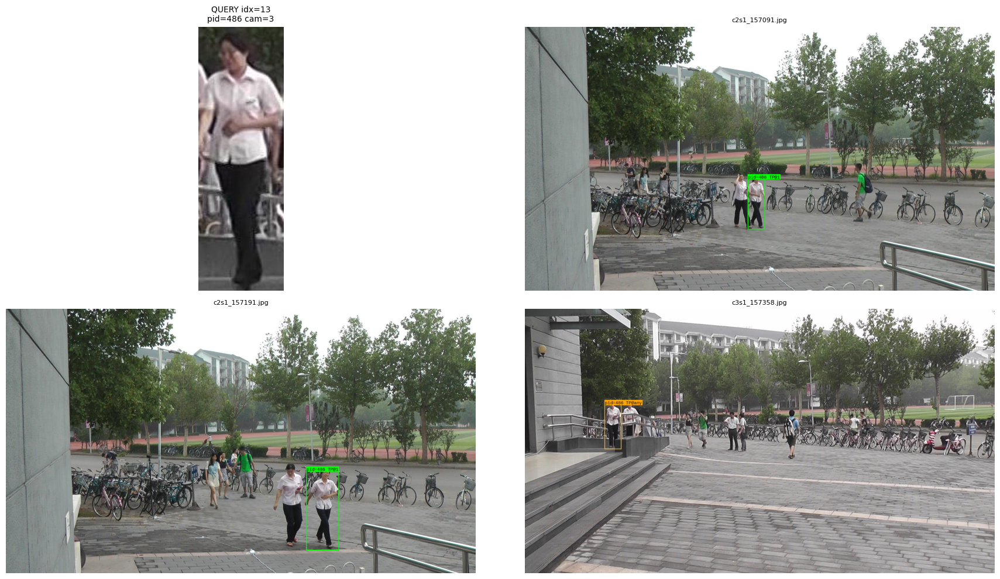

In [87]:
# Choose a query
chosen_query = diffs[2]["query_idx"]

# query search over gallery and viz 
ranked_af_cx = visualize_person_search(
    query_idx=chosen_query,
    gallery_eval=gallery_eval,
    query_ds=query_ds,
    gallery_dets=test_detections,
    gallery_feats=test_gallery_feats_cx,
    query_box_feats=query_feats_cx,
    det_thresh=0.3,
    topk_images=3,
    ignore_cam_id=True,
)

Now, we can compare the two models:

QUERY idx=13 | pid=486 | det_thresh=0.3 | topk=5
------------------------------------------------------------------------------------------
				 ResNet50 			 ConvNeXt
------------------------------------------------------------------------------------------
img_name               | rank state  sim   det  match  | rank state  sim   det  match
------------------------------------------------------------------------------------------
c3s1_157358.jpg        |    1 TP@any 0.760  1.00     2 |    3 TP@any 0.758  1.00     3
c2s1_157091.jpg        |    3   TP@1 0.621  1.00     1 |    1   TP@1 0.806  1.00     1
c3s1_157083.jpg        |    2 TP@any 0.626  0.99     2 |    4 TP@any 0.727  0.99     2
c2s1_157191.jpg        |   10 TP@any 0.578  1.00     2 |    2   TP@1 0.759  1.00     1
c3s2_059378.jpg        |    4     FP 0.608  1.00  noGT |  101     FP 0.546  1.00  noGT
c3s1_157483.jpg        |    5   TP@1 0.604  0.99     1 |   29   TP@1 0.612  0.99     1
c3s1_148558.jpg        |  265     FP 0.365 

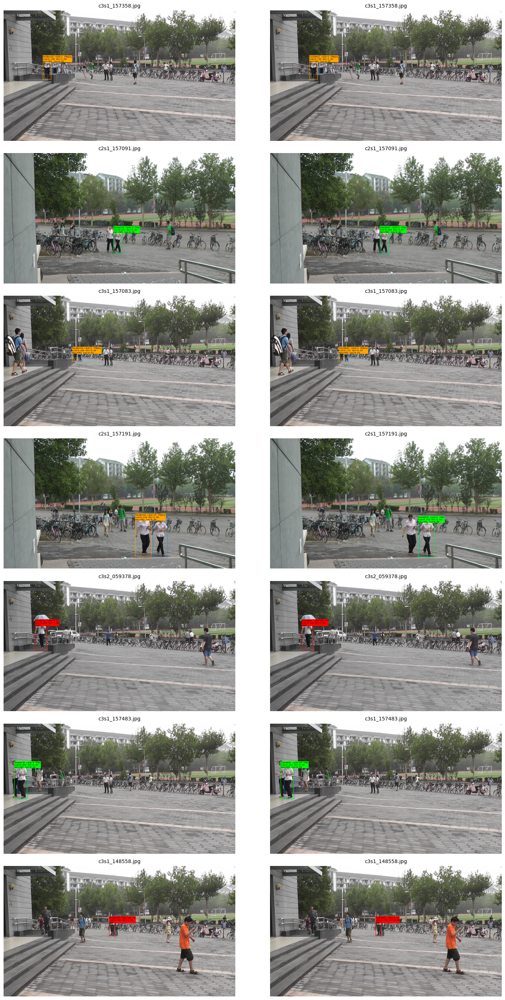

In [ ]:
def compute_query_gts_map(gallery_eval, q_pid, q_img_name): # we need to redefine this
    """
    Used to determine TP/FP, by building a dict between gallery img and a GT bbox
    """
    query_gts = {}
    for a in gallery_eval.annotations:
        name = a["img_name"]
        if name == q_img_name:
            continue
        pids = np.asarray(a["pids"])
        if q_pid not in pids:
            continue
        mask = (pids == q_pid)
        gts = np.asarray(a["boxes"][mask], dtype=np.float32).reshape(-1, 4)
        if len(gts) > 0:
            query_gts[name] = gts
    return query_gts


def load_queryinfo_boxes(query_info_path):
    """
    Parse PRW query_info.txt
    common format: pid x y w h img_name
    Returns: dict[(img_name, pid)] -> [x1,y1,x2,y2] 
    """
    qmap = {}
    with open(query_info_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split()

            # img_name is last token, pid is first, then 4 numbers
            if len(parts) < 6:
                continue

            pid = int(parts[0])
            img_name = parts[-1]
            nums = parts[1:-1]
            if len(nums) < 4:
                continue

            x, y, w, h = map(float, nums[:4])
            x1, y1, x2, y2 = x, y, x + w, y + h
            qmap[(img_name, pid)] = np.array([x1, y1, x2, y2], dtype=np.float32)

    return qmap


def crop_xyxy(img, box_xyxy, pad=0, clamp=True):
    """
    img: PIL.Image
    box_xyxy: [x1,y1,x2,y2]
    pad: pixels of padding around the box
    """
    W, H = img.size
    x1, y1, x2, y2 = map(float, box_xyxy)

    x1 -= pad; y1 -= pad; x2 += pad; y2 += pad

    if clamp:
        x1 = max(0, min(W - 1, x1))
        y1 = max(0, min(H - 1, y1))
        x2 = max(1, min(W,     x2))
        y2 = max(1, min(H,     y2))

    return img.crop((int(round(x1)), int(round(y1)), int(round(x2)), int(round(y2))))

# -- compute per-image best box and state for a model --
def rank_all_gallery_images_for_query(
    query_idx,
    gallery_eval, query_ds,
    gallery_dets, gallery_feats,
    query_box_feats,
    det_thresh=0.3,
    ignore_cam_id=True,
    normalize=True,
):
    """
    Compute the ranking of all gallery images for a single query, returning the best box/similarity and TP/FP state for each image.
    """
    q_anno = query_ds.annotations[query_idx]
    q_pid = int(np.asarray(q_anno["pids"]).ravel()[0])
    q_cam = int(q_anno["cam_id"])
    q_img_name = q_anno["img_name"]

    q_feat = np.asarray(query_box_feats[query_idx], dtype=np.float32).reshape(-1)
    if normalize:
        q_feat = l2norm(q_feat)

    query_gts = compute_query_gts_map(gallery_eval, q_pid, q_img_name)

    ranked = []
    for anno, det, feat in zip(gallery_eval.annotations, gallery_dets, gallery_feats):
        g_name = anno["img_name"]
        if g_name == q_img_name:
            continue
        if (not ignore_cam_id) and (int(anno["cam_id"]) == q_cam):
            continue
        if det is None or len(det) == 0:
            continue

        det = np.asarray(det, dtype=np.float32)
        feat = np.asarray(feat, dtype=np.float32)
        if det.shape[1] < 5:
            continue

        keep = np.where(det[:, 4] >= det_thresh)[0]
        if len(keep) == 0:
            continue
        det = det[keep]
        feat = feat[keep].reshape(len(keep), -1)
        if normalize:
            feat = l2norm(feat)

        sims = feat.dot(q_feat).ravel()
        order = np.argsort(sims)[::-1]
        sims_s = sims[order]
        det_s = det[order]

        best_sim = float(sims_s[0])
        best_box = det_s[0, :4].astype(np.float32)
        best_det_score = float(det_s[0, 4])

        state = "FP"
        match_rank = None
        match_iou = None

        if g_name in query_gts:
            gts = query_gts[g_name]
            for j, roi in enumerate(det_s[:, :4].astype(np.float32)):
                max_iou, k, thr = max_iou_with_gts(roi, gts)
                if max_iou is not None and max_iou >= thr:
                    match_rank = j
                    match_iou = float(max_iou)
                    break
            if match_rank is None:
                state = "FP"
            elif match_rank == 0:
                state = "TP@1"
            else:
                state = "TP@any"
        else:
            state = "FP"

        ranked.append({
            "img_name": g_name,
            "best_sim": best_sim,
            "best_det_score": best_det_score,
            "best_box": best_box,
            "state": state,
            "match_rank": match_rank,
            "match_iou": match_iou,
            "has_gt": (g_name in query_gts),
        })

    ranked.sort(key=lambda d: d["best_sim"], reverse=True)
    return ranked, query_gts, q_pid

# -- top-K compare --
def compare_two_models_topk(
    query_idx,
    gallery_eval, query_ds,
    gallery_dets,
    feats_A, qfeats_A,
    feats_B, qfeats_B,
    modelA_name="ResNet50",
    modelB_name="ConvNeXt",
    det_thresh=0.3,
    topk=5,
    ignore_cam_id=True,
    normalize=True,
    frames_dir=path_imgs,
    make_figure=True,
    max_union=10,   # max num. for viz issues
):
    """Compare two models on a single query, showing the top-K gallery images for each model, and their union sorted by best rank.
    """
    # compute full rankings
    rankedA, query_gts, q_pid = rank_all_gallery_images_for_query(
        query_idx, gallery_eval, query_ds, gallery_dets, feats_A, qfeats_A,
        det_thresh=det_thresh, ignore_cam_id=ignore_cam_id, normalize=normalize
    )
    rankedB, _, _ = rank_all_gallery_images_for_query(
        query_idx, gallery_eval, query_ds, gallery_dets, feats_B, qfeats_B,
        det_thresh=det_thresh, ignore_cam_id=ignore_cam_id, normalize=normalize
    )

    topA = rankedA[:topk]
    topB = rankedB[:topk]

    # indexes for quick lookup
    idxA = {d["img_name"]: i for i, d in enumerate(rankedA)}
    idxB = {d["img_name"]: i for i, d in enumerate(rankedB)}
    mapA = {d["img_name"]: d for d in rankedA}
    mapB = {d["img_name"]: d for d in rankedB}

    union_names = []
    seen = set()
    for d in topA + topB:
        n = d["img_name"]
        if n not in seen:
            union_names.append(n)
            seen.add(n)

    # sort by best (min) rank among models
    union_names.sort(key=lambda n: min(idxA.get(n, 10**9), idxB.get(n, 10**9)))

    # print table
    print("="*90)
    print(f"QUERY idx={query_idx} | pid={q_pid} | det_thresh={det_thresh} | topk={topk}")
    print("-"*90)
    print(f"\t\t\t\t {modelA_name} \t\t\t {modelB_name}")
    print("-"*90)
    header = f"{'img_name':22s} | rank state  sim   det  match  | rank state  sim   det  match"
    print(header)
    print("-"*90)

    def fmt_entry(m, idx, name):
        if name not in m:
            return f"{'--':>4s} {'--':>6s} {'--':>5s} {'--':>5s} {'--':>5s}"
        d = m[name]
        r = idx.get(name, None)
        rstr = "--" if r is None else f"{r+1:>2d}"
        st = d["state"]
        sim = f"{d['best_sim']:.3f}"
        det = f"{d['best_det_score']:.2f}"
        if d["has_gt"]:
            mr = "--" if d["match_rank"] is None else f"{d['match_rank']+1:d}"
        else:
            mr = "noGT"
        return f"{rstr:>4s} {st:>6s} {sim:>5s} {det:>5s} {mr:>5s}"

    for n in union_names:
        a = fmt_entry(mapA, idxA, n)
        b = fmt_entry(mapB, idxB, n)
        print(f"{n:22s} | {a} | {b}")

    print("="*90)

    # make figure side-by-side (modelA vs modelB)
    if not make_figure:
        return union_names, topA, topB, rankedA, rankedB
    
    union_plot = union_names[:max_union]
    nrows = len(union_plot)
    ncols = 2
    
    fig = plt.figure(figsize=(16, 4 * nrows))
    
    for r, name in enumerate(union_plot):
    
        for c, (mname, mmap) in enumerate([
            (modelA_name, mapA),
            (modelB_name, mapB)
        ]):
    
            ax = plt.subplot(nrows, ncols, r * ncols + c + 1)
    
            img_path = osp.join(frames_dir, name)
            img = Image.open(img_path).convert("RGB")
    
            # draw GT (blue)
            if name in query_gts:
                img = draw_boxes(img, query_gts[name], color=(0, 128, 255), width=2)
    
            if name in mmap:
                d = mmap[name]
    
                # color by state
                if d["state"] == "TP@1":
                    color = (0, 255, 0)
                elif d["state"] == "TP@any":
                    color = (255, 165, 0)
                else:
                    color = (255, 0, 0)
    
                rank_here = idxA.get(name) if c == 0 else idxB.get(name)
                rank_str = "--" if rank_here is None else str(rank_here + 1)
    
                lines = [
                    f"{mname} rank={rank_str} {d['state']}",
                    f"sim={d['best_sim']:.3f} det={d['best_det_score']:.2f}",
                ]
    
                if d["has_gt"]:
                    if d["match_rank"] is None:
                        lines.append("match=NONE")
                    else:
                        lines.append(f"match@{d['match_rank']+1} iou={d['match_iou']:.2f}")
                else:
                    lines.append("noGT")
    
                img = draw_bbox_with_text(
                    img,
                    d["best_box"],
                    lines,
                    color=color,
                    width=3
                )
    
            else:
                # not ranked for this model
                img = draw_bbox_with_text(
                    img,
                    [5, 5, 250, 60],
                    [f"{mname}: not ranked"],
                    color=(128, 128, 128),
                    width=2
                )
    
            ax.imshow(img)
            ax.set_title(name, fontsize=10)
            ax.axis("off")
    
    plt.tight_layout()
    plt.show()

    return union_names, topA, topB, rankedA, rankedB

# compare the two models on the most informative queries
union_names, topA, topB, ranked_resnet, ranked_cnx = compare_two_models_topk(
    query_idx=chosen_query,
    gallery_eval=gallery_eval,
    query_ds=query_ds,
    gallery_dets=test_detections,
    feats_A=test_gallery_feats,
    qfeats_A=query_feats,
    feats_B=test_gallery_feats_cx,
    qfeats_B=query_feats_cx,
    modelA_name="ResNet50",
    modelB_name="ConvNeXt",
    det_thresh=0.3,
    topk=5,
    ignore_cam_id=True,
    normalize=True,
    frames_dir=path_imgs,
    make_figure=True,
    max_union=10
)

> Here we have visually compared the two models (ArcFace + ResNet50 on the left, ArcFace + ConvNeXt-Tiny on the right) for the person re-identification task.
>
> Again, the blue bbox represents the ground truth, while the green one the correct prediction (TP@1);
> Orange bounding boxes indicate cases where the detection does not correspond to the highest-ranked correct match, although the true identity is still present in the image (TP@any);
Red bounding boxes represent false positives, i.e., images where the retrieved detection does not correspond to the query identity;
> 
> Overall, the ConvNeXt-based model shows more consistent top-1 retrievals and fewer ranking ambiguities. In several examples, the ResNet50 backbone either assigns the correct identity a lower rank (orange) or produces clear false positives (red), while ConvNeXt correctly identifies the target as the highest-confidence match (green).
> 
> Notably, in the third image, the baseline model fails to correctly identify the target person, while the ConvNeXt-based model successfully retrieves the correct identity. This example highlights the improved discriminative capability of the stronger backbone.

## **Final considerations**

The experimental results highlight the central role of representation quality and loss formulation in person re-identification.

From a theoretical perspective, ArcFace and InfoNCE optimize the embedding space in fundamentally different ways.

ArcFace is an angular margin–based classification loss. By introducing an additive angular margin in the softmax formulation, it explicitly enforces:

- intra-class compactness (features of the same identity cluster tightly),

- inter-class separation (different identities are pushed apart in angular space).

This geometric constraint directly shapes the hyperspherical embedding space, making it particularly effective for identity discrimination. In our experiments, ArcFace provides stable convergence and strong generalization, especially when combined with a powerful backbone such as ConvNeXt-Tiny.

In contrast, InfoNCE (supervised contrastive loss) operates through pairwise comparisons within a batch. It encourages embeddings of the same identity to be close while pushing apart embeddings of different identities based on a temperature-scaled similarity distribution. Unlike ArcFace, it does not rely on a global classification boundary but instead optimizes local relational structure within each mini-batch.

This difference explains the observed behaviors:

- When applied on ResNet50, contrastive fine-tuning improves mAP. The weaker backbone benefits from additional relational constraints, leading to better ranking consistency.

- However, when applied on ConvNeXt-Tiny, the same contrastive setup does not generalize as expected. Since the backbone already produces highly discriminative embeddings under ArcFace, additional contrastive optimization may introduce over-regularization or distort the well-structured angular margins, leading to reduced test performance.

In other words, ArcFace defines a strong global geometric structure in the embedding space, while InfoNCE refines local pairwise relationships. On a weaker backbone, this refinement is beneficial. On a stronger backbone, it may interfere with an already well-optimized angular representation.

Overall, the results confirm that:

- Backbone capacity is the dominant factor in performance improvement.

- Loss design interacts with representation strength.

- More complex training recipes do not automatically guarantee better generalization.

For these reasons, ArcFace + ConvNeXt-Tiny is selected as the final model, as it provides the best trade-off between discriminative power and generalization stability.

## Future work
1. Alternative **Metric Learning architectures** 

    - Investigate Siamese networks;

    - Evaluate transformer-based backbones (e.g., ViT-based ReID models) to assess the impact of global attention.

2. **Detection–ReID**
    
    - Joint optimization of detection and embedding (end-to-end training), since our current setup treats them as disjoint modules;
  
    - Further training of the detector (e.g. more epochs, alternative training recipes);
    
    - Systematic tuning of detection threshold to analyze the recall vs noise trade-off;
    
    - Varying RPN anchor sizes and aspect ratios;
    
    - Modifying RoI Align pooling resolution to better preserve identity-specific details;
    
    - Studying how bounding box expansion (*expand_ratio*) affects contextual identity discrimination;

3. **Hyperparameter Tuning**
    
    - Temperature (τ) tuning for contrastive learning;
    
    - Learning rate and weight decay scheduling for fine-tuning stability;
    
    - Embedding dimensionality exploration;
    
    - Stronger early stopping strategies for contrastive fine-tuning.

4. **Data Augmentation** and **preprocessing**

    - Advanced augmentations (color jitter, random erasing, stronger geometric transforms);
    
    - Alternative cropping strategies for query and gallery images;
    
    - Multi-scale training and evaluation;
    
    - Different image resizing policies to balance resolution and generalization.